<a href="https://colab.research.google.com/github/adityaraghavan98/camm_hackathon/blob/k4my4r/docs/day_15_/Aditya_CAMM_hackaton_Day15_Vector_Field_Problem.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CAMM Hackathon 15: Vector Field Problem - NanoLithography


- In scanning-probe nanolithography, a biased AFM tip can switch ferroelectric polarization not only through voltage amplitude, but also through the geometry of its motion.
- The tip trajectory creates an effective in-plane electric-field pattern that can guide local switching and stabilize designed domain configurations.

Examples:

[Vasudevan, R.; et al. On-demand nanoengineering of in-plane ferroelectric topologies](https://www.nature.com/articles/s41565-024-01792-1)

[Vasudevan R., et al. Deterministic arbitrary switching of polarization in a ferroelectric thin film](https://www.nature.com/articles/ncomms5971)

####Today, we are going to focus on **designing lithography trajectories** that generate target electric-field patterns in a minimal ferroelectric model.



We consider a sharp, electrically biased probe moving across a ferroelectric surface. As the probe moves, it can locally switch the material’s polarization, making the lithography trajectory itself part of the design problem.

Two key assumptions define the simplified model:

- A moving probe creates an effective trailing in-plane field in its wake. The local polarization tends to align with the direction of probe motion.
- At each moment, you control two main parameters: the probe position or path, and the applied voltage (V). In a more complete model, the probe speed could also be included, since it affects domain-growth dynamics and therefore the final written pattern.

In this simplified challenge, the effective writing field is approximated as


$\;\mathbf{E}_{\text{eff}} = V\cdot\hat{\mathbf t}\;$

where ($\hat{\mathbf t}$) is the local travel direction of the probe. The direction of motion sets the field orientation, the voltage sets its sign and strength, and larger ($|V|$) switches a wider region of the material.

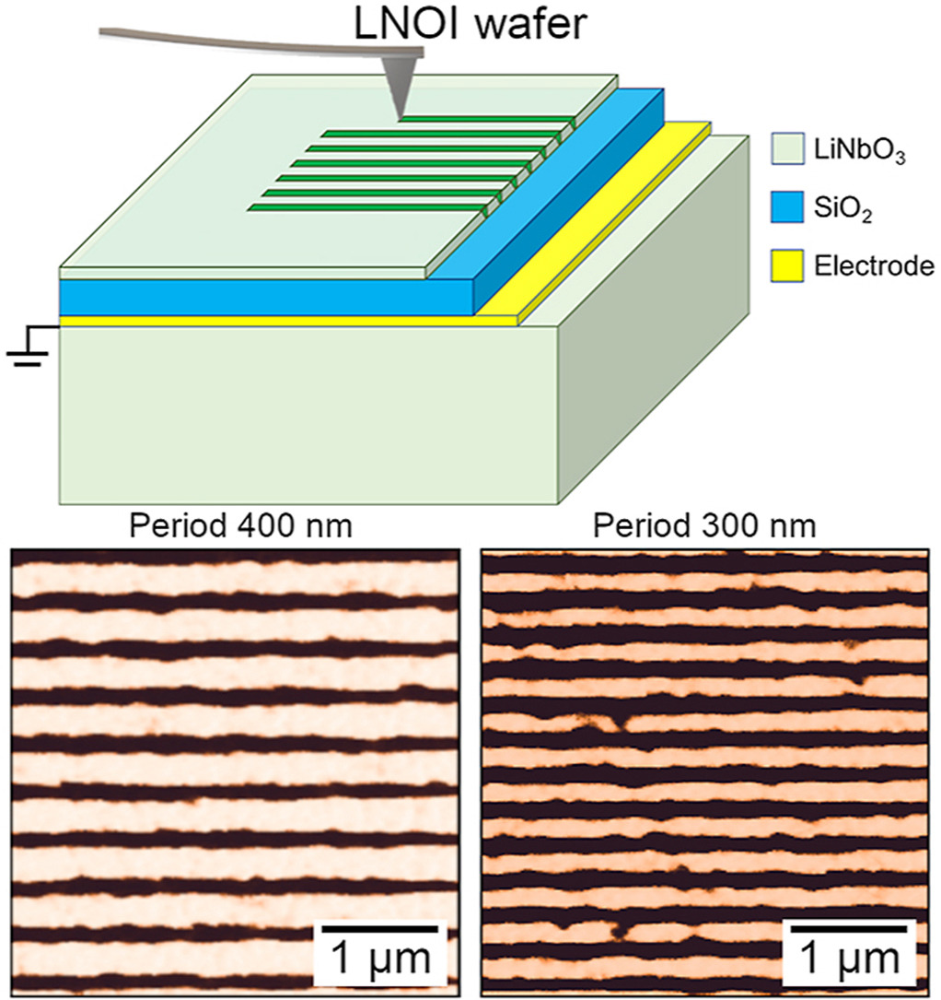

*https://www.sciencedirect.com/science/article/pii/S0272884221025785

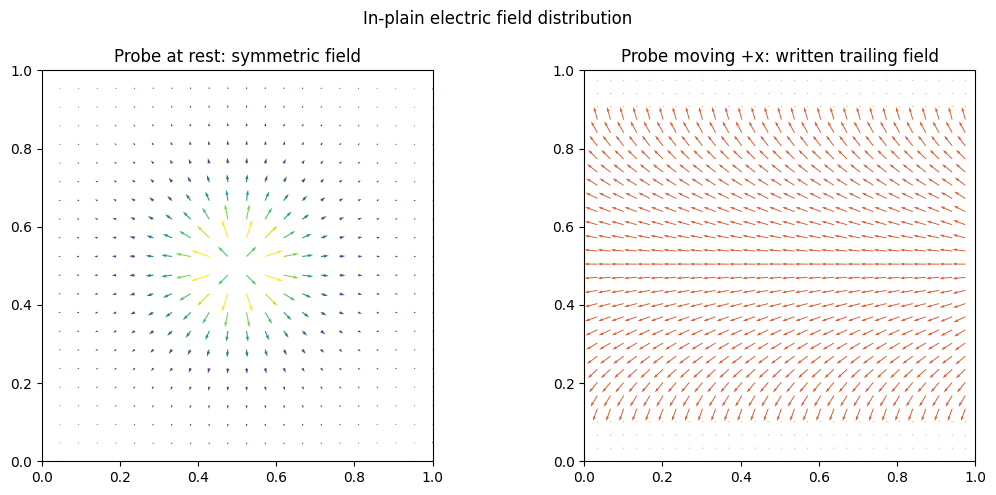

In [1]:
import numpy as np, matplotlib.pyplot as plt

h = 0.10                                   # pen (point-charge) height above the surface
def E(X, Y, xc, yc):                       # in-plane surface field from a charge at (xc, yc, h)
    dx, dy = X - xc, Y - yc
    r3 = (dx*dx + dy*dy + h*h)**1.5
    return dx/r3, dy/r3

fig, ax = plt.subplots(1, 2, figsize=(11, 5))

# --- AT REST: charge sits at the centre -> symmetric field, no chosen direction ---
g = np.linspace(0, 1, 22); X, Y = np.meshgrid(g, g)
Ex, Ey = E(X, Y, 0.5, 0.5)
ax[0].quiver(X, Y, Ex, Ey, np.hypot(Ex, Ey), cmap="viridis", scale=800)
ax[0].set_title("Probe at rest: symmetric field")

# --- MOVING +x: the spot that switches LAST is written (overwrite) -> a trailing wake ---
gg = np.linspace(0, 1, 120); Xs, Ys = np.meshgrid(gg, gg)
Px = np.zeros_like(Xs); Py = np.zeros_like(Xs); Ec = 6.0     # switching threshold
for xc in np.linspace(-0.25, 1.25, 300):                     # pen sweeps left -> right
    ex, ey = E(Xs, Ys, xc, 0.5); m = np.hypot(ex, ey); sw = m > Ec
    Px[sw], Py[sw] = ex[sw]/m[sw], ey[sw]/m[sw]              # last write wins
s = slice(None, None, 4)
ax[1].quiver(Xs[s, s], Ys[s, s], Px[s, s], Py[s, s], color="#D85A30", scale=30)
ax[1].set_title("Probe moving +x: written trailing field")

for a in ax: a.set_aspect("equal"); a.set_xlim(0, 1); a.set_ylim(0, 1)
plt.suptitle('In-plain electric field distribution')
plt.tight_layout(); plt.show()

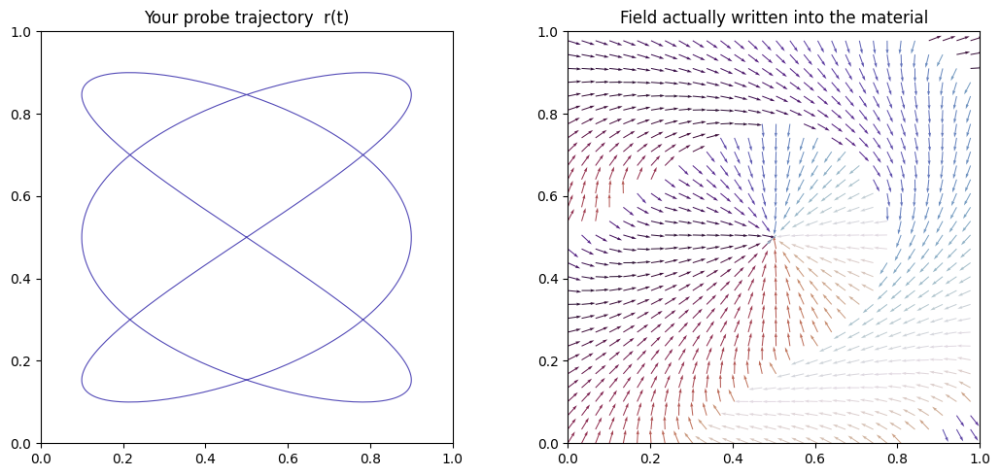

In [2]:
import numpy as np, matplotlib.pyplot as plt

h, Ec = 0.06, 12.0                         # pen height above surface, switching threshold
def Efield(X, Y, xc, yc, V):               # in-plane field of the charged pen (V scales it)
    dx, dy = X - xc, Y - yc; r3 = (dx*dx + dy*dy + h*h)**1.5
    return V*dx/r3, V*dy/r3

# ---- YOUR design: path r(t) + voltage V(t)  (sign of V = direction, |V| = brush width) ----
t = np.linspace(0, 1, 500)
def path(t): return 0.5 + 0.40*np.sin(2*np.pi*3*t), 0.5 + 0.40*np.sin(2*np.pi*2*t)
def volt(t): return np.where(t < 0.5, 1.0, -1.0)        # e.g. flip the sign halfway
xc, yc = path(t); V = volt(t)

# ---- write into the film: move the pen; the last above-threshold field wins (overwrite) ----
g = np.linspace(0, 1, 90); X, Y = np.meshgrid(g, g)
Px = np.full_like(X, np.nan); Py = np.full_like(X, np.nan)
for i in range(len(t)):
    ex, ey = Efield(X, Y, xc[i], yc[i], V[i]); m = np.hypot(ex, ey); sw = m > Ec
    Px[sw], Py[sw] = ex[sw]/m[sw], ey[sw]/m[sw]

fig, ax = plt.subplots(1, 2, figsize=(11, 5))
ax[0].plot(xc, yc, lw=.8, c="#534AB7"); ax[0].set_title("Your probe trajectory  r(t)")
s = slice(None, None, 3)
ax[1].quiver(X[s,s], Y[s,s], Px[s,s], Py[s,s], np.arctan2(Py, Px)[s,s],
             cmap="twilight", scale=30)
ax[1].set_title("Field actually written into the material")
for a in ax: a.set_aspect("equal"); a.set_xlim(0, 1); a.set_ylim(0, 1)
plt.tight_layout(); plt.show()

### Possible Problems to be Solves


#### **1. Prompt-to-trajectory generation**

Develop a system that converts a user request into a lithography trajectory.
For example, given prompts such as “write a vortex,” “create a centre-divergent pattern,” or “make a dense array of flux-closure-like structures,” the system should generate a probe path (x(t), y(t)) and voltage profile (V(t)).

#### 2. **Forward simulation of the written pattern (high complexity)**

Build a simplified model that predicts the resulting in-plane polarization or electric-field pattern from a proposed trajectory.
The model does not need to describe the full probe–sample physics, but should capture the main idea: probe motion defines the local field direction, voltage defines switching strength and sign, and material response can be approximated through simple parameters such as permittivity or switching width.

#### 3. **Trajectory optimization**

Given a target structure type and constraints, optimize the trajectory parameters.
Possible objectives include improving pattern quality, increasing feature density, reducing writing time, minimizing voltage exposure, or matching a desired domain size.

#### 4. **Inverse design from a target pattern**

Solve the inverse problem: given a desired vector-field image/pattern, generate a trajectory that could approximately write it.


The solution can be implemented either as an agentic system or as any other algorithmic approach.

In [3]:
#your code

# Visualize the written field for different simple trajectories

Straight path:
{'winding_number': np.float64(0.0), 'valid_fraction': np.float64(0.775), 'label': 'not vortex-like'}


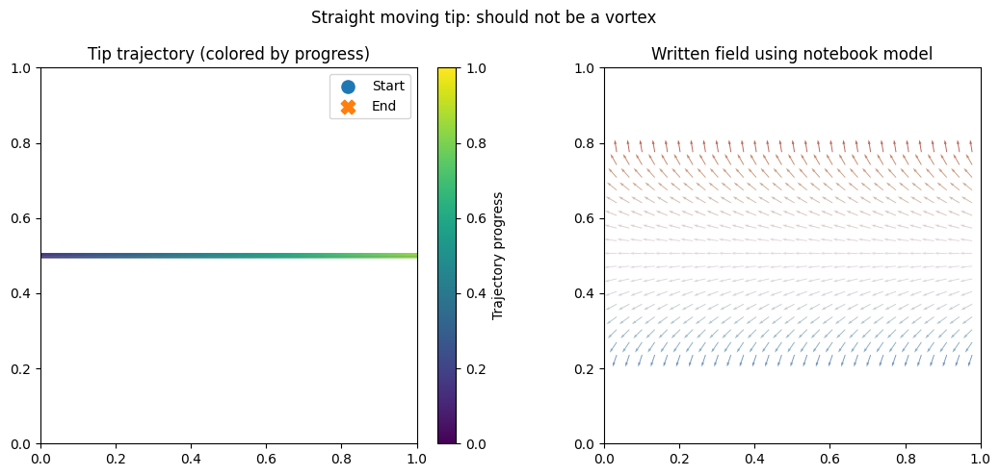


Circular path:
{'winding_number': np.float64(1.4135798584282297e-16), 'valid_fraction': np.float64(1.0), 'label': 'not vortex-like'}


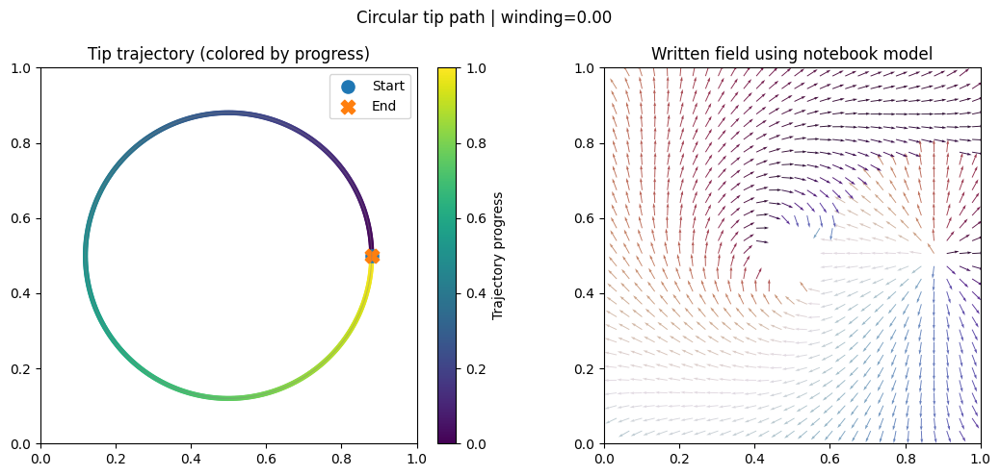


Spiral path:
{'winding_number': np.float64(0.0), 'valid_fraction': np.float64(1.0), 'label': 'not vortex-like'}


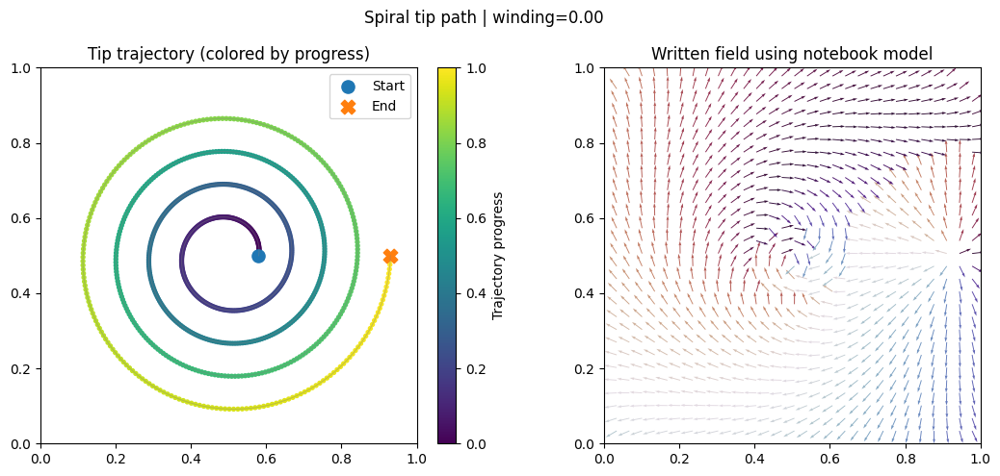

In [5]:
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# Use the notebook's same point-charge + overwrite model
# ============================================================

h = 0.06
Ec = 12.0

def Efield(X, Y, xc, yc, V):
    dx = X - xc
    dy = Y - yc
    r3 = (dx*dx + dy*dy + h*h)**1.5
    return V * dx / r3, V * dy / r3

def simulate_written_field(xc, yc, V, N=90):
    """
    Same logic as notebook:
    moving charged tip writes wherever |E| > Ec.
    Last write wins.
    """
    g = np.linspace(0, 1, N)
    X, Y = np.meshgrid(g, g)

    Px = np.full_like(X, np.nan)
    Py = np.full_like(Y, np.nan)

    for i in range(len(xc)):
        ex, ey = Efield(X, Y, xc[i], yc[i], V[i])
        m = np.hypot(ex, ey)
        sw = m > Ec

        Px[sw] = ex[sw] / m[sw]
        Py[sw] = ey[sw] / m[sw]

    return X, Y, Px, Py

# ============================================================
# Trajectories to try
# ============================================================

def straight_path(n=500):
    t = np.linspace(0, 1, n)
    x = -0.25 + 1.5 * t
    y = np.full_like(t, 0.5)
    V = np.ones_like(t)
    return x, y, V

def circle_path(n=700, radius=0.38, clockwise=False):
    t = np.linspace(0, 1, n)
    theta = 2 * np.pi * t

    if clockwise:
        theta = -theta

    x = 0.5 + radius * np.cos(theta)
    y = 0.5 + radius * np.sin(theta)
    V = np.ones_like(t)

    return x, y, V

def spiral_path(n=900, r0=0.08, r1=0.43, turns=4, clockwise=False):
    t = np.linspace(0, 1, n)
    theta = 2 * np.pi * turns * t

    if clockwise:
        theta = -theta

    r = r0 + (r1 - r0) * t

    x = 0.5 + r * np.cos(theta)
    y = 0.5 + r * np.sin(theta)
    V = np.ones_like(t)

    return x, y, V

# ============================================================
# Vortex estimator using winding number
# ============================================================

def estimate_winding_number(Px, Py, X, Y, center=(0.5, 0.5), radius=0.30, n=240):
    """
    Estimate whether the written vector field rotates once around a loop.
    winding ~ +1 or -1 means vortex-like.
    winding ~ 0 means not vortex-like.
    """
    cx, cy = center

    loop_theta = np.linspace(0, 2*np.pi, n, endpoint=False)
    xs = cx + radius * np.cos(loop_theta)
    ys = cy + radius * np.sin(loop_theta)

    xgrid = X[0, :]
    ygrid = Y[:, 0]

    angles = []

    for x, y in zip(xs, ys):
        ix = np.argmin(np.abs(xgrid - x))
        iy = np.argmin(np.abs(ygrid - y))

        px = Px[iy, ix]
        py = Py[iy, ix]

        if np.isfinite(px) and np.isfinite(py):
            angles.append(np.arctan2(py, px))
        else:
            angles.append(np.nan)

    angles = np.array(angles)
    valid = np.isfinite(angles)

    if valid.mean() < 0.6:
        return {
            "winding_number": np.nan,
            "valid_fraction": valid.mean(),
            "label": "not enough written area"
        }

    idx = np.arange(n)

    # Fill missing values by interpolation
    angles_filled = np.interp(idx, idx[valid], angles[valid])

    unwrapped = np.unwrap(angles_filled)

    # closed-loop total rotation
    total_rotation = unwrapped[-1] - unwrapped[0]
    winding = total_rotation / (2*np.pi)

    if winding > 0.5:
        label = "counter-clockwise vortex-like"
    elif winding < -0.5:
        label = "clockwise vortex-like"
    else:
        label = "not vortex-like"

    return {
        "winding_number": winding,
        "valid_fraction": valid.mean(),
        "label": label
    }

# ============================================================
# Plot helper
# ============================================================

# def plot_written_result(xc, yc, X, Y, Px, Py, title):
#     fig, ax = plt.subplots(1, 2, figsize=(11, 5))

#     ax[0].plot(xc, yc, lw=1)
#     ax[0].set_title("Tip trajectory")

#     s = slice(None, None, 3)

#     angle = np.arctan2(Py, Px)

#     ax[1].quiver(
#         X[s, s],
#         Y[s, s],
#         Px[s, s],
#         Py[s, s],
#         angle[s, s],
#         cmap="twilight",
#         scale=30
#     )
#     ax[1].set_title("Written field using notebook model")

#     for a in ax:
#         a.set_aspect("equal")
#         a.set_xlim(0, 1)
#         a.set_ylim(0, 1)

#     plt.suptitle(title)
#     plt.tight_layout()
#     plt.show()

def plot_written_result(xc, yc, X, Y, Px, Py, title):
    fig, ax = plt.subplots(1, 2, figsize=(12, 5))

    # ------------------------------------------------------------
    # Left: colored trajectory
    # ------------------------------------------------------------
    tcolor = np.linspace(0, 1, len(xc))

    sc = ax[0].scatter(
        xc, yc,
        c=tcolor,
        cmap="viridis",
        s=8
    )

    # connect points lightly so path looks continuous
    ax[0].plot(xc, yc, color="gray", alpha=0.35, lw=0.8)

    # mark start and end clearly
    ax[0].scatter(xc[0], yc[0], marker="o", s=90, label="Start")
    ax[0].scatter(xc[-1], yc[-1], marker="X", s=110, label="End")

    cbar = plt.colorbar(sc, ax=ax[0], fraction=0.046, pad=0.04)
    cbar.set_label("Trajectory progress")

    ax[0].set_title("Tip trajectory (colored by progress)")
    ax[0].legend()

    # ------------------------------------------------------------
    # Right: written field
    # ------------------------------------------------------------
    s = slice(None, None, 3)
    angle = np.arctan2(Py, Px)

    ax[1].quiver(
        X[s, s],
        Y[s, s],
        Px[s, s],
        Py[s, s],
        angle[s, s],
        cmap="twilight",
        scale=30
    )
    ax[1].set_title("Written field using notebook model")

    for a in ax:
        a.set_aspect("equal")
        a.set_xlim(0, 1)
        a.set_ylim(0, 1)

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# ============================================================
# Case 1: reproduce the notebook-style straight moving tip
# ============================================================

xc, yc, V = straight_path()
X, Y, Px, Py = simulate_written_field(xc, yc, V)

result = estimate_winding_number(Px, Py, X, Y)

print("Straight path:")
print(result)

plot_written_result(
    xc, yc, X, Y, Px, Py,
    title="Straight moving tip: should not be a vortex"
)

# ============================================================
# Case 2: circular path
# ============================================================

xc, yc, V = circle_path(clockwise=False)
X, Y, Px, Py = simulate_written_field(xc, yc, V)

result = estimate_winding_number(Px, Py, X, Y)

print("\nCircular path:")
print(result)

plot_written_result(
    xc, yc, X, Y, Px, Py,
    title=f"Circular tip path | winding={result['winding_number']:.2f}"
)

# ============================================================
# Case 3: spiral path
# ============================================================

xc, yc, V = spiral_path(turns=4, clockwise=False)
X, Y, Px, Py = simulate_written_field(xc, yc, V)

result = estimate_winding_number(Px, Py, X, Y)

print("\nSpiral path:")
print(result)

plot_written_result(
    xc, yc, X, Y, Px, Py,
    title=f"Spiral tip path | winding={result['winding_number']:.2f}"
)

## Compare and score the different trajectories to get target field

Trajectories ranked by efficiency:


,trajectory,quality,coverage,alignment,angle_error_deg,winding_number,path_length,efficiency_quality_per_length
0,single circle r=0.24,0.730065,1.000000,0.460130,60.388235,1.000000e+00,1.504939,0.485113
1,single circle r=0.30,0.797310,1.000000,0.594620,47.659345,1.000000e+00,1.881173,0.423837
2,single circle r=0.36,0.841053,1.000000,0.682106,38.420325,-1.413580e-16,2.257408,0.372575
3,single circle r=0.42,0.805716,0.932732,0.727649,33.047280,0.000000e+00,2.633643,0.305932
4,spiral turns=2.5,0.873989,1.000000,0.747977,32.480820,0.000000e+00,3.875028,0.225544
5,spiral turns=3.5,0.875877,1.000000,0.751754,31.855231,0.000000e+00,5.406809,0.161995
6,3 concentric rings,0.857009,1.000000,0.714017,33.894699,1.000000e+00,5.495557,0.155946
7,4 concentric rings,0.862362,1.000000,0.724724,33.072650,1.000000e+00,7.255106,0.118863
8,spiral turns=5.0,0.873254,1.000000,0.746508,32.258620,0.000000e+00,7.709854,0.113265
9,5 concentric rings,0.860847,1.000000,0.721694,33.766024,1.000000e+00,9.023786,0.095398



Most efficient trajectory: single circle r=0.24
Best quality trajectory: spiral turns=3.5


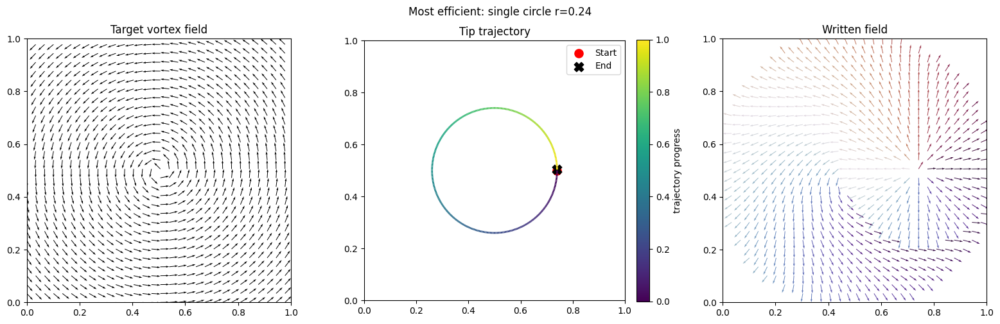

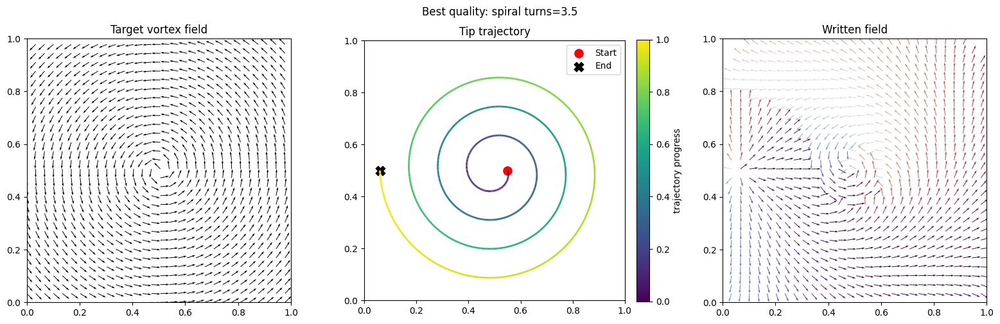

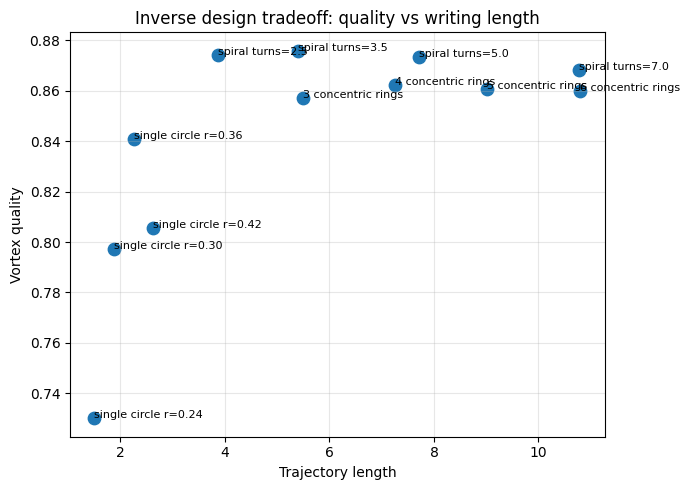

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.collections import LineCollection

# ============================================================
# 1. Same point-charge writing model as the notebook
# ============================================================

h, Ec = 0.06, 12.0

def Efield(X, Y, xc, yc, V):
    dx = X - xc
    dy = Y - yc
    r3 = (dx*dx + dy*dy + h*h)**1.5
    return V * dx / r3, V * dy / r3

def simulate_written_field(xc, yc, V, N=90):
    """
    Forward model from the notebook:
    - biased tip produces local in-plane field
    - pixels switch if |E| > Ec
    - latest switched direction overwrites previous direction
    """
    g = np.linspace(0, 1, N)
    X, Y = np.meshgrid(g, g)

    Px = np.full_like(X, np.nan, dtype=float)
    Py = np.full_like(Y, np.nan, dtype=float)

    for i in range(len(xc)):
        if V[i] == 0:
            continue

        ex, ey = Efield(X, Y, xc[i], yc[i], V[i])
        m = np.hypot(ex, ey)

        sw = m > Ec

        Px[sw] = ex[sw] / m[sw]
        Py[sw] = ey[sw] / m[sw]

    return X, Y, Px, Py

# ============================================================
# 2. Target vortex field
# ============================================================

def target_vortex(X, Y, center=(0.5, 0.5), clockwise=False):
    """
    Target vortex centered at center.

    Counter-clockwise vortex:
        P = [-(y-yc), x-xc]

    Clockwise vortex:
        P = [(y-yc), -(x-xc)]
    """
    cx, cy = center

    Tx = -(Y - cy)
    Ty =  (X - cx)

    if clockwise:
        Tx, Ty = -Tx, -Ty

    mag = np.hypot(Tx, Ty) + 1e-12

    return Tx / mag, Ty / mag

# ============================================================
# 3. Trajectory families
# ============================================================

def circle_path(radius=0.35, n=500, clockwise=True, Vwrite=1.0):
    t = np.linspace(0, 1, n, endpoint=False)
    theta = 2 * np.pi * t

    if clockwise:
        theta = -theta

    x = 0.5 + radius * np.cos(theta)
    y = 0.5 + radius * np.sin(theta)
    V = np.full_like(x, Vwrite)

    return x, y, V

def spiral_path(r0=0.06, r1=0.44, turns=4, n=800, clockwise=True, Vwrite=1.0):
    t = np.linspace(0, 1, n)
    theta = 2 * np.pi * turns * t

    if clockwise:
        theta = -theta

    r = r0 + (r1 - r0) * t

    x = 0.5 + r * np.cos(theta)
    y = 0.5 + r * np.sin(theta)
    V = np.full_like(x, Vwrite)

    return x, y, V

def multi_ring_path(radii, n_per_ring=220, clockwise=True, Vwrite=1.0):
    """
    Concentric circular writing.
    Voltage is turned off during connector moves between rings.
    """
    xs, ys, Vs = [], [], []

    prev_x, prev_y = None, None

    for j, r in enumerate(radii):
        n = max(60, int(n_per_ring * r / 0.35))

        theta = np.linspace(0, 2*np.pi, n, endpoint=False)

        if clockwise:
            theta = -theta

        # small phase offset between rings
        theta = theta + j * np.pi / 10

        x = 0.5 + r * np.cos(theta)
        y = 0.5 + r * np.sin(theta)
        V = np.full_like(x, Vwrite)

        # Move to next ring with voltage off
        if prev_x is not None:
            cn = 25
            xs.append(np.linspace(prev_x, x[0], cn))
            ys.append(np.linspace(prev_y, y[0], cn))
            Vs.append(np.zeros(cn))

        xs.append(x)
        ys.append(y)
        Vs.append(V)

        prev_x, prev_y = x[-1], y[-1]

    return np.concatenate(xs), np.concatenate(ys), np.concatenate(Vs)

# ============================================================
# 4. Metrics: how vortex-like is the written field?
# ============================================================

def trajectory_length(x, y):
    return float(np.sum(np.hypot(np.diff(x), np.diff(y))))

def evaluate_written_field(Px, Py, X, Y, target_clockwise=False):
    """
    Compare written vector field to the target vortex.

    quality:
        combines coverage and directional agreement.

    alignment:
        +1 = perfect local direction match
         0 = random/perpendicular
        -1 = opposite direction
    """
    Tx, Ty = target_vortex(X, Y, clockwise=target_clockwise)

    R = np.hypot(X - 0.5, Y - 0.5)

    # Avoid the exact center because vortex direction is undefined there
    roi = (R > 0.08) & (R < 0.45)

    written = np.isfinite(Px) & np.isfinite(Py)
    valid = roi & written

    coverage = valid.sum() / roi.sum()

    if valid.sum() == 0:
        return {
            "quality": 0.0,
            "coverage": 0.0,
            "alignment": -1.0,
            "angle_error_deg": 180.0
        }

    dot = Px[valid] * Tx[valid] + Py[valid] * Ty[valid]
    dot = np.clip(dot, -1, 1)

    alignment = float(np.mean(dot))
    angle_error = float(np.degrees(np.mean(np.arccos(dot))))

    # Convert alignment from [-1, 1] to [0, 1]
    direction_score = (alignment + 1) / 2

    quality = float(coverage * direction_score)

    return {
        "quality": quality,
        "coverage": float(coverage),
        "alignment": alignment,
        "angle_error_deg": angle_error
    }

def winding_number(Px, Py, X, Y, center=(0.5, 0.5), radius=0.32, n=240):
    """
    Estimate topological winding number around a circular loop.
    Vortex-like field should give winding close to +1 or -1.
    """
    cx, cy = center
    theta = np.linspace(0, 2*np.pi, n, endpoint=False)

    xs = cx + radius * np.cos(theta)
    ys = cy + radius * np.sin(theta)

    xgrid = X[0, :]
    ygrid = Y[:, 0]

    angles = []

    for x, y in zip(xs, ys):
        ix = np.argmin(np.abs(xgrid - x))
        iy = np.argmin(np.abs(ygrid - y))

        px = Px[iy, ix]
        py = Py[iy, ix]

        if np.isfinite(px) and np.isfinite(py):
            angles.append(np.arctan2(py, px))
        else:
            angles.append(np.nan)

    angles = np.array(angles)
    valid = np.isfinite(angles)

    if valid.mean() < 0.6:
        return np.nan

    idx = np.arange(n)
    angles_filled = np.interp(idx, idx[valid], angles[valid])
    angles_unwrapped = np.unwrap(angles_filled)

    total_rotation = angles_unwrapped[-1] - angles_unwrapped[0]

    return float(total_rotation / (2*np.pi))

# ============================================================
# 5. Plotting with colored trajectory
# ============================================================

def colored_trajectory_plot(ax, x, y, title="Trajectory"):
    points = np.array([x, y]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)

    progress = np.linspace(0, 1, len(segments))

    lc = LineCollection(
        segments,
        cmap="viridis",
        array=progress,
        linewidth=2.0
    )

    ax.add_collection(lc)

    ax.scatter(x[0], y[0], s=90, marker="o", color="red", label="Start")
    ax.scatter(x[-1], y[-1], s=110, marker="X", color="black", label="End")

    ax.set_title(title)
    ax.set_aspect("equal")
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.legend()

    return lc

def plot_solution(x, y, X, Y, Px, Py, title):
    Tx, Ty = target_vortex(X, Y)

    s = slice(None, None, 3)

    fig, ax = plt.subplots(1, 3, figsize=(16, 5))

    # target
    ax[0].quiver(
        X[s, s],
        Y[s, s],
        Tx[s, s],
        Ty[s, s],
        scale=30
    )
    ax[0].set_title("Target vortex field")

    # trajectory
    lc = colored_trajectory_plot(ax[1], x, y, title="Tip trajectory")
    cbar = plt.colorbar(lc, ax=ax[1], fraction=0.046, pad=0.04)
    cbar.set_label("trajectory progress")

    # written field
    angle = np.arctan2(Py, Px)

    ax[2].quiver(
        X[s, s],
        Y[s, s],
        Px[s, s],
        Py[s, s],
        angle[s, s],
        cmap="twilight",
        scale=30
    )
    ax[2].set_title("Written field")

    for a in ax:
        a.set_aspect("equal")
        a.set_xlim(0, 1)
        a.set_ylim(0, 1)

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# ============================================================
# 6. Try different trajectory designs
# ============================================================

candidate_paths = []

# Single circular paths
for r in [0.24, 0.30, 0.36, 0.42]:
    x, y, V = circle_path(radius=r, clockwise=True)
    candidate_paths.append((f"single circle r={r:.2f}", x, y, V))

# Spiral paths
for turns in [2.5, 3.5, 5.0, 7.0]:
    x, y, V = spiral_path(r0=0.05, r1=0.44, turns=turns, clockwise=True)
    candidate_paths.append((f"spiral turns={turns:.1f}", x, y, V))

# Concentric ring paths
for nrings in [3, 4, 5, 6]:
    radii = np.linspace(0.12, 0.43, nrings)
    x, y, V = multi_ring_path(radii, clockwise=True)
    candidate_paths.append((f"{nrings} concentric rings", x, y, V))

results = []
saved = {}

for name, x, y, V in candidate_paths:
    X, Y, Px, Py = simulate_written_field(x, y, V, N=90)

    m = evaluate_written_field(Px, Py, X, Y)
    L = trajectory_length(x, y)
    w = winding_number(Px, Py, X, Y)

    efficiency = m["quality"] / (L + 1e-12)

    row = {
        "trajectory": name,
        "quality": m["quality"],
        "coverage": m["coverage"],
        "alignment": m["alignment"],
        "angle_error_deg": m["angle_error_deg"],
        "winding_number": w,
        "path_length": L,
        "efficiency_quality_per_length": efficiency
    }

    results.append(row)
    saved[name] = (x, y, V, X, Y, Px, Py)

df_results = pd.DataFrame(results)

df_results = df_results.sort_values(
    by="efficiency_quality_per_length",
    ascending=False
).reset_index(drop=True)

print("Trajectories ranked by efficiency:")
display(df_results)

# ============================================================
# 7. Plot best efficient trajectory and best quality trajectory
# ============================================================

best_eff_name = df_results.iloc[0]["trajectory"]

best_quality_name = (
    pd.DataFrame(results)
    .sort_values(by="quality", ascending=False)
    .iloc[0]["trajectory"]
)

print("\nMost efficient trajectory:", best_eff_name)
print("Best quality trajectory:", best_quality_name)

x, y, V, X, Y, Px, Py = saved[best_eff_name]
plot_solution(
    x, y, X, Y, Px, Py,
    title=f"Most efficient: {best_eff_name}"
)

if best_quality_name != best_eff_name:
    x, y, V, X, Y, Px, Py = saved[best_quality_name]
    plot_solution(
        x, y, X, Y, Px, Py,
        title=f"Best quality: {best_quality_name}"
    )

# ============================================================
# 8. Pareto-style plot: quality vs trajectory length
# ============================================================

plt.figure(figsize=(7, 5))

plt.scatter(
    df_results["path_length"],
    df_results["quality"],
    s=80
)

for _, row in df_results.iterrows():
    plt.text(
        row["path_length"],
        row["quality"],
        row["trajectory"],
        fontsize=8
    )

plt.xlabel("Trajectory length")
plt.ylabel("Vortex quality")
plt.title("Inverse design tradeoff: quality vs writing length")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [7]:
from matplotlib.collections import LineCollection
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

def colored_trajectory_plot_no_cbar(ax, x, y, title="Trajectory"):
    """
    Plot trajectory with a progress colormap.
    Start = red circle
    End = black X
    """
    if len(x) < 2:
        ax.plot(x, y)
        return

    points = np.array([x, y]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)

    progress = np.linspace(0, 1, len(segments))

    lc = LineCollection(
        segments,
        cmap="viridis",
        norm=Normalize(0, 1),
        linewidth=2.0
    )
    lc.set_array(progress)
    ax.add_collection(lc)

    ax.scatter(x[0], y[0], s=70, marker="o", color="red", label="Start")
    ax.scatter(x[-1], y[-1], s=90, marker="X", color="black", label="End")

    ax.set_title(title)
    ax.set_aspect("equal")
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

def plot_all_tested_cases(df_results, saved, sort_by="efficiency_quality_per_length"):
    """
    Plot trajectory + written field for all tested cases.
    """
    df_plot = df_results.sort_values(by=sort_by, ascending=False).reset_index(drop=True)
    ncases = len(df_plot)

    fig, axes = plt.subplots(ncases, 2, figsize=(13, 4 * ncases), squeeze=False)

    # One shared colorbar for trajectory progress
    sm = ScalarMappable(norm=Normalize(0, 1), cmap="viridis")
    sm.set_array([])

    for i, row in df_plot.iterrows():
        name = row["trajectory"]
        x, y, V, X, Y, Px, Py = saved[name]

        # ----------------------------------------
        # Left: trajectory
        # ----------------------------------------
        axL = axes[i, 0]
        colored_trajectory_plot_no_cbar(
            axL, x, y,
            title=f"{name}\nTrajectory"
        )

        # only show legend once
        if i == 0:
            axL.legend(loc="upper right")

        # ----------------------------------------
        # Right: written field
        # ----------------------------------------
        axR = axes[i, 1]
        s = slice(None, None, 3)

        angle = np.arctan2(Py, Px)

        axR.quiver(
            X[s, s],
            Y[s, s],
            Px[s, s],
            Py[s, s],
            angle[s, s],
            cmap="twilight",
            scale=30
        )

        axR.set_aspect("equal")
        axR.set_xlim(0, 1)
        axR.set_ylim(0, 1)

        axR.set_title(
            f"Written field\n"
            f"quality={row['quality']:.3f}, "
            f"coverage={row['coverage']:.3f}, "
            f"alignment={row['alignment']:.3f}, "
            f"winding={row['winding_number']:.2f}"
        )

    # shared colorbar for trajectory progress
    cbar = fig.colorbar(sm, ax=axes[:, 0], fraction=0.02, pad=0.02)
    cbar.set_label("Trajectory progress")

    plt.suptitle("All tested trajectories and resulting written fields", y=1.002, fontsize=14)
    plt.tight_layout()
    plt.show()

/tmp/ipykernel_3982/3059862403.py:102: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


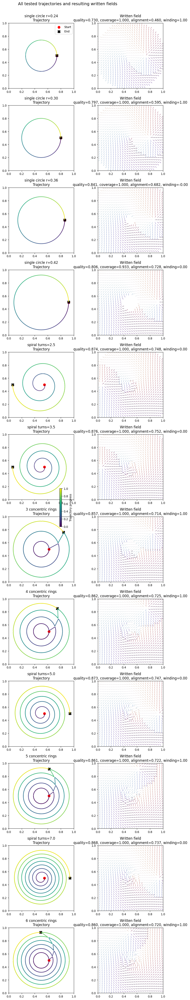

In [8]:
plot_all_tested_cases(df_results, saved)

## Learn from trajectory-field patterns and predict trajectory for target field

In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, WhiteKernel, ConstantKernel
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

# ============================================================
# 1. Build candidate trajectory library
# ============================================================

def make_candidate_pool():
    rows = []

    # ------------------------------------------------------------
    # Circle candidates
    # ------------------------------------------------------------
    for r in np.linspace(0.18, 0.44, 14):
        x, y, V = circle_path(radius=r, clockwise=True, n=450)
        L = trajectory_length(x, y)

        rows.append({
            "name": f"circle_r={r:.3f}",
            "family": "circle",
            "family_code": 0,
            "radius": r,
            "r0": 0.0,
            "r1": r,
            "turns": 1.0,
            "nrings": 1,
            "path_length_est": L
        })

    # ------------------------------------------------------------
    # Spiral candidates
    # ------------------------------------------------------------
    for turns in np.linspace(1.5, 7.0, 12):
        for r1 in np.linspace(0.30, 0.45, 6):
            x, y, V = spiral_path(
                r0=0.05,
                r1=r1,
                turns=turns,
                clockwise=True,
                n=750
            )
            L = trajectory_length(x, y)

            rows.append({
                "name": f"spiral_turns={turns:.2f}_r1={r1:.2f}",
                "family": "spiral",
                "family_code": 1,
                "radius": r1,
                "r0": 0.05,
                "r1": r1,
                "turns": turns,
                "nrings": 1,
                "path_length_est": L
            })

    # ------------------------------------------------------------
    # Concentric ring candidates
    # ------------------------------------------------------------
    for nrings in range(2, 8):
        for r1 in np.linspace(0.30, 0.45, 6):
            radii = np.linspace(0.10, r1, nrings)

            x, y, V = multi_ring_path(
                radii,
                clockwise=True,
                n_per_ring=220
            )

            L = trajectory_length(x, y)

            rows.append({
                "name": f"rings_n={nrings}_r1={r1:.2f}",
                "family": "rings",
                "family_code": 2,
                "radius": r1,
                "r0": 0.10,
                "r1": r1,
                "turns": 1.0,
                "nrings": nrings,
                "path_length_est": L
            })

    df = pd.DataFrame(rows)

    df["path_length_norm"] = (
        df["path_length_est"] - df["path_length_est"].min()
    ) / (
        df["path_length_est"].max() - df["path_length_est"].min()
    )

    return df


candidate_pool = make_candidate_pool()

print("Number of possible trajectories in library:", len(candidate_pool))
display(candidate_pool.head())

Number of possible trajectories in library: 122


,name,family,family_code,radius,r0,r1,turns,nrings,path_length_est,path_length_norm
0,circle_r=0.180,circle,0,0.18,0.0,0.18,1.0,1,1.128451,0.000000
1,circle_r=0.200,circle,0,0.20,0.0,0.20,1.0,1,1.253834,0.010926
2,circle_r=0.220,circle,0,0.22,0.0,0.22,1.0,1,1.379218,0.021852
3,circle_r=0.240,circle,0,0.24,0.0,0.24,1.0,1,1.504601,0.032778
4,circle_r=0.260,circle,0,0.26,0.0,0.26,1.0,1,1.629985,0.043704


In [10]:
def make_path_from_candidate(row):
    family = row["family"]

    if family == "circle":
        x, y, V = circle_path(
            radius=row["radius"],
            clockwise=True,
            n=450
        )

    elif family == "spiral":
        x, y, V = spiral_path(
            r0=row["r0"],
            r1=row["r1"],
            turns=row["turns"],
            clockwise=True,
            n=750
        )

    elif family == "rings":
        radii = np.linspace(row["r0"], row["r1"], int(row["nrings"]))

        x, y, V = multi_ring_path(
            radii,
            clockwise=True,
            n_per_ring=220
        )

    else:
        raise ValueError(f"Unknown family: {family}")

    return x, y, V

In [11]:
def run_virtual_experiment(row, cost_penalty=0.25):
    """
    This is the simulated equivalent of one real AFM experiment.

    Input:
        trajectory parameters

    Output:
        vortex quality, winding number, path length, efficiency
    """

    x, y, V = make_path_from_candidate(row)

    X, Y, Px, Py = simulate_written_field(x, y, V, N=90)

    metrics = evaluate_written_field(Px, Py, X, Y)
    w = winding_number(Px, Py, X, Y)
    L = trajectory_length(x, y)

    # Quality rewards vortex match.
    # Objective penalizes long writing paths.
    objective = metrics["quality"] - cost_penalty * row["path_length_norm"]

    result = {
        "name": row["name"],
        "family": row["family"],
        "family_code": row["family_code"],
        "radius": row["radius"],
        "r0": row["r0"],
        "r1": row["r1"],
        "turns": row["turns"],
        "nrings": row["nrings"],
        "path_length": L,
        "path_length_norm": row["path_length_norm"],
        "quality": metrics["quality"],
        "coverage": metrics["coverage"],
        "alignment": metrics["alignment"],
        "angle_error_deg": metrics["angle_error_deg"],
        "winding_number": w,
        "objective": objective
    }

    saved_result = {
        "x": x,
        "y": y,
        "V": V,
        "X": X,
        "Y": Y,
        "Px": Px,
        "Py": Py
    }

    return result, saved_result

In [12]:
feature_cols = [
    "family_code",
    "radius",
    "r0",
    "r1",
    "turns",
    "nrings",
    "path_length_norm"
]

def get_features(df):
    return df[feature_cols].values.astype(float)

In [13]:
# ============================================================
# 2. Active learning loop
# ============================================================

np.random.seed(2)

n_initial = 5
n_active_steps = 8
beta = 1.5

all_results = []
all_saved = {}

# ------------------------------------------------------------
# Pick a small diverse initial set manually
# ------------------------------------------------------------

initial_names = [
    "circle_r=0.180",
    "circle_r=0.440",
    "spiral_turns=1.50_r1=0.30",
    "spiral_turns=7.00_r1=0.45",
    "rings_n=4_r1=0.39"
]

# Some names may differ slightly because of rounding.
# Match by closest text when needed.
initial_rows = []

for target_name in initial_names:
    exact = candidate_pool[candidate_pool["name"] == target_name]

    if len(exact) > 0:
        initial_rows.append(exact.iloc[0])
    else:
        # fallback: random unevaluated candidate
        initial_rows.append(candidate_pool.sample(1, random_state=len(initial_rows)).iloc[0])

# ------------------------------------------------------------
# Run initial experiments
# ------------------------------------------------------------

for row in initial_rows:
    result, saved_result = run_virtual_experiment(row)

    all_results.append(result)
    all_saved[result["name"]] = saved_result

print("Initial experiments complete:")
display(pd.DataFrame(all_results))

Initial experiments complete:


,name,family,family_code,radius,r0,r1,turns,nrings,path_length,path_length_norm,quality,coverage,alignment,angle_error_deg,winding_number,objective
0,circle_r=0.180,circle,0,0.18,0.00,0.18,1.0,1,1.128451,0.000000,0.650920,1.000000,0.301840,71.750739,1.0,0.650920
1,circle_r=0.440,circle,0,0.44,0.00,0.44,1.0,1,2.758436,0.142039,0.781353,0.900738,0.734918,32.095045,1.0,0.745844
2,spiral_turns=1.50_r1=0.30,spiral,1,0.30,0.05,0.30,1.5,1,1.672664,0.047423,0.741535,0.995078,0.490406,57.513592,1.0,0.729679
3,spiral_turns=7.00_r1=0.45,spiral,1,0.45,0.05,0.45,7.0,1,11.003960,0.860562,0.869069,1.000000,0.738139,32.873585,1.0,0.653929
4,rings_n=4_r1=0.39,rings,2,0.39,0.10,0.39,1.0,4,6.468422,0.465331,0.852975,1.000000,0.705950,35.328756,0.0,0.736642


In [14]:
for step in range(n_active_steps):

    df_obs = pd.DataFrame(all_results)

    evaluated_names = set(df_obs["name"])

    df_unseen = candidate_pool[
        ~candidate_pool["name"].isin(evaluated_names)
    ].copy()

    X_train = get_features(df_obs)
    y_train = df_obs["objective"].values

    X_pool = get_features(df_unseen)

    # Gaussian process surrogate model
    kernel = (
        ConstantKernel(1.0, (1e-3, 1e3))
        * Matern(length_scale=np.ones(X_train.shape[1]), nu=2.5)
        + WhiteKernel(noise_level=1e-4)
    )

    model = make_pipeline(
        StandardScaler(),
        GaussianProcessRegressor(
            kernel=kernel,
            normalize_y=True,
            n_restarts_optimizer=3,
            random_state=step
        )
    )

    model.fit(X_train, y_train)

    mu, sigma = model.predict(X_pool, return_std=True)

    # Upper confidence bound acquisition:
    # choose trajectory with high predicted objective and/or high uncertainty
    acquisition = mu + beta * sigma

    chosen_idx = np.argmax(acquisition)
    chosen_row = df_unseen.iloc[chosen_idx]

    result, saved_result = run_virtual_experiment(chosen_row)

    all_results.append(result)
    all_saved[result["name"]] = saved_result

    print(
        f"Step {step+1:02d}: tested {result['name']} | "
        f"quality={result['quality']:.3f}, "
        f"objective={result['objective']:.3f}, "
        f"winding={result['winding_number']:.2f}"
    )

/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 4 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 5 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 6 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442

Step 01: tested spiral_turns=1.50_r1=0.45 | quality=0.861, objective=0.833, winding=0.00


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 2 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 5 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:

Step 02: tested spiral_turns=2.00_r1=0.45 | quality=0.874, objective=0.829, winding=-0.00


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


Step 03: tested rings_n=2_r1=0.45 | quality=0.825, objective=0.767, winding=1.00


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 5 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


Step 04: tested spiral_turns=1.50_r1=0.42 | quality=0.844, objective=0.819, winding=0.00


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 5 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


Step 05: tested spiral_turns=2.50_r1=0.45 | quality=0.879, objective=0.817, winding=0.00


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 5 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


Step 06: tested spiral_turns=2.00_r1=0.42 | quality=0.858, objective=0.817, winding=0.00


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 5 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


Step 07: tested spiral_turns=2.50_r1=0.42 | quality=0.864, objective=0.808, winding=0.00


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


Step 08: tested spiral_turns=1.50_r1=0.39 | quality=0.824, objective=0.802, winding=0.00


In [15]:
df_active = pd.DataFrame(all_results)

df_active_ranked = df_active.sort_values(
    by="objective",
    ascending=False
).reset_index(drop=True)

print("Final active-learning results ranked by objective:")
display(df_active_ranked)

best_name = df_active_ranked.iloc[0]["name"]

print("Best trajectory found:", best_name)

Final active-learning results ranked by objective:


,name,family,family_code,radius,r0,r1,turns,nrings,path_length,path_length_norm,quality,coverage,alignment,angle_error_deg,winding_number,objective
0,spiral_turns=1.50_r1=0.45,spiral,1,0.45,0.05,0.45,1.5,1,2.401185,0.110907,0.860779,1.000000,0.721559,36.230836,0.000000e+00,0.833053
1,spiral_turns=2.00_r1=0.45,spiral,1,0.45,0.05,0.45,2.0,1,3.175798,0.178408,0.874021,1.000000,0.748041,32.935608,-1.413580e-16,0.829419
2,spiral_turns=1.50_r1=0.42,spiral,1,0.42,0.05,0.42,1.5,1,2.255278,0.098193,0.843888,1.000000,0.687776,39.464087,0.000000e+00,0.819340
3,spiral_turns=2.00_r1=0.42,spiral,1,0.42,0.05,0.42,2.0,1,2.983812,0.161678,0.857713,1.000000,0.715425,36.232574,0.000000e+00,0.817293
4,spiral_turns=2.50_r1=0.45,spiral,1,0.45,0.05,0.45,2.5,1,3.954509,0.246266,0.878764,1.000000,0.757527,31.498259,0.000000e+00,0.817197
5,spiral_turns=2.50_r1=0.42,spiral,1,0.42,0.05,0.42,2.5,1,3.716061,0.225487,0.863883,1.000000,0.727766,34.601464,0.000000e+00,0.807511
6,spiral_turns=1.50_r1=0.39,spiral,1,0.39,0.05,0.39,1.5,1,2.109460,0.085486,0.823625,1.000000,0.647250,43.299230,0.000000e+00,0.802253
7,rings_n=2_r1=0.45,rings,2,0.45,0.10,0.45,1.0,2,3.788157,0.231770,0.824951,1.000000,0.649903,38.706566,1.000000e+00,0.767009
8,circle_r=0.440,circle,0,0.44,0.00,0.44,1.0,1,2.758436,0.142039,0.781353,0.900738,0.734918,32.095045,1.000000e+00,0.745844
9,rings_n=4_r1=0.39,rings,2,0.39,0.10,0.39,1.0,4,6.468422,0.465331,0.852975,1.000000,0.705950,35.328756,0.000000e+00,0.736642


Best trajectory found: spiral_turns=1.50_r1=0.45


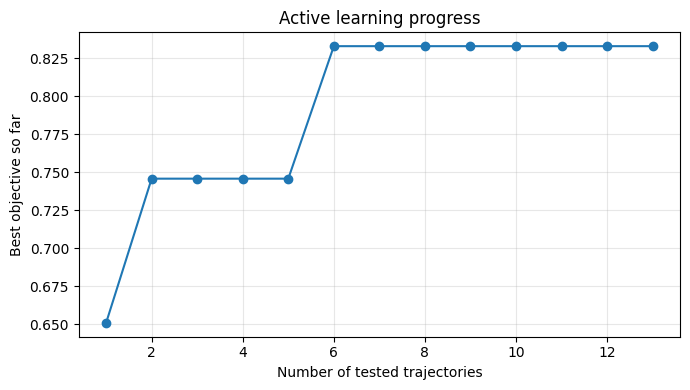

In [16]:
best_so_far = df_active["objective"].cummax()

plt.figure(figsize=(7, 4))
plt.plot(np.arange(1, len(best_so_far) + 1), best_so_far, marker="o")
plt.xlabel("Number of tested trajectories")
plt.ylabel("Best objective so far")
plt.title("Active learning progress")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

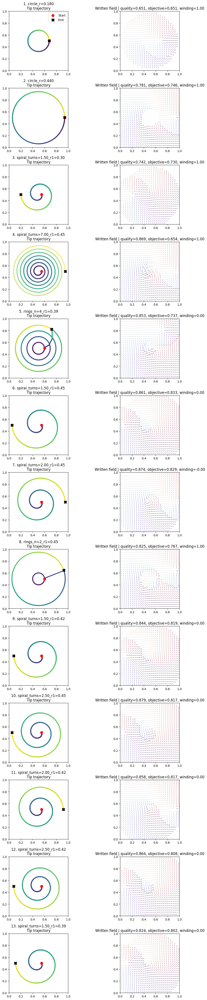

In [17]:
def plot_active_learning_cases(df_active, all_saved):
    ncases = len(df_active)

    fig, axes = plt.subplots(
        ncases, 2,
        figsize=(12, 3.6 * ncases),
        squeeze=False
    )

    for i, row in df_active.iterrows():
        name = row["name"]
        data = all_saved[name]

        x = data["x"]
        y = data["y"]
        X = data["X"]
        Y = data["Y"]
        Px = data["Px"]
        Py = data["Py"]

        # -------------------------------
        # Trajectory plot
        # -------------------------------
        ax = axes[i, 0]

        progress = np.linspace(0, 1, len(x))

        sc = ax.scatter(
            x,
            y,
            c=progress,
            cmap="viridis",
            s=6
        )

        ax.plot(x, y, color="gray", alpha=0.25, lw=0.6)

        ax.scatter(x[0], y[0], color="red", marker="o", s=70, label="Start")
        ax.scatter(x[-1], y[-1], color="black", marker="X", s=90, label="End")

        ax.set_aspect("equal")
        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)
        ax.set_title(f"{i+1}. {name}\nTip trajectory")

        if i == 0:
            ax.legend()

        # -------------------------------
        # Written field plot
        # -------------------------------
        ax = axes[i, 1]

        s = slice(None, None, 3)
        angle = np.arctan2(Py, Px)

        ax.quiver(
            X[s, s],
            Y[s, s],
            Px[s, s],
            Py[s, s],
            angle[s, s],
            cmap="twilight",
            scale=30
        )

        ax.set_aspect("equal")
        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)

        ax.set_title(
            f"Written field | "
            f"quality={row['quality']:.3f}, "
            f"objective={row['objective']:.3f}, "
            f"winding={row['winding_number']:.2f}"
        )

    plt.tight_layout()
    plt.show()


plot_active_learning_cases(df_active, all_saved)

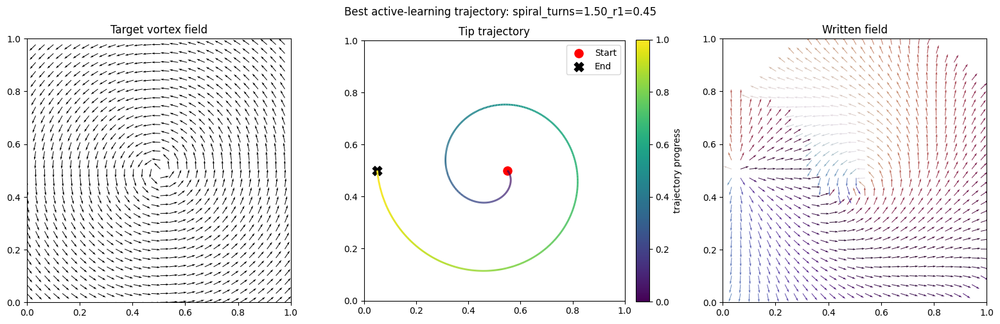

In [18]:
best_name = df_active_ranked.iloc[0]["name"]
best_data = all_saved[best_name]

plot_solution(
    best_data["x"],
    best_data["y"],
    best_data["X"],
    best_data["Y"],
    best_data["Px"],
    best_data["Py"],
    title=f"Best active-learning trajectory: {best_name}"
)

## SHort trajectories --> AL on full trajectories

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

from matplotlib.collections import LineCollection
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

# Same model style as the notebook
h = 0.06
Ec = 12.0

def Efield(X, Y, xc, yc, V):
    dx = X - xc
    dy = Y - yc
    r3 = (dx*dx + dy*dy + h*h)**1.5
    return V * dx / r3, V * dy / r3

def simulate_written_field(xc, yc, V, N=90):
    g = np.linspace(0, 1, N)
    X, Y = np.meshgrid(g, g)

    Px = np.full_like(X, np.nan, dtype=float)
    Py = np.full_like(Y, np.nan, dtype=float)

    for i in range(len(xc)):
        if V[i] == 0:
            continue

        ex, ey = Efield(X, Y, xc[i], yc[i], V[i])
        mag = np.hypot(ex, ey)

        sw = mag > Ec

        Px[sw] = ex[sw] / mag[sw]
        Py[sw] = ey[sw] / mag[sw]

    return X, Y, Px, Py

def trajectory_length(x, y):
    return float(np.sum(np.hypot(np.diff(x), np.diff(y))))

In [20]:
def connect_paths(paths, connector_points=20):
    """
    paths: list of (x, y, V)
    Voltage is turned off during connector moves.
    """
    xs, ys, Vs = [], [], []

    prev_x, prev_y = None, None

    for x, y, V in paths:
        if prev_x is not None:
            cx = np.linspace(prev_x, x[0], connector_points)
            cy = np.linspace(prev_y, y[0], connector_points)
            cV = np.zeros(connector_points)

            xs.append(cx)
            ys.append(cy)
            Vs.append(cV)

        xs.append(x)
        ys.append(y)
        Vs.append(V)

        prev_x, prev_y = x[-1], y[-1]

    return np.concatenate(xs), np.concatenate(ys), np.concatenate(Vs)


def short_line(center=(0.5, 0.5), angle=0.0, length=0.32, n=120, Vwrite=1.0):
    cx, cy = center

    s = np.linspace(-0.5, 0.5, n)
    x = cx + length * s * np.cos(angle)
    y = cy + length * s * np.sin(angle)
    V = np.full_like(x, Vwrite)

    return x, y, V


def parallel_lines(center=(0.5, 0.5), angle=0.0, length=0.34, spacing=0.055, n_lines=3, n=120):
    cx, cy = center

    # perpendicular direction for offsets
    px = -np.sin(angle)
    py =  np.cos(angle)

    offsets = spacing * (np.arange(n_lines) - (n_lines - 1) / 2)

    paths = []

    for off in offsets:
        c = (cx + off * px, cy + off * py)
        paths.append(short_line(center=c, angle=angle, length=length, n=n))

    return connect_paths(paths)


def crossing_lines(center=(0.5, 0.5), angle1=0.0, angle2=np.pi/2, length=0.36, n=120):
    p1 = short_line(center=center, angle=angle1, length=length, n=n)
    p2 = short_line(center=center, angle=angle2, length=length, n=n)

    return connect_paths([p1, p2])


def overlapping_lines(center=(0.5, 0.5), angle=0.0, length=0.34, n=120, reverse_second=True):
    x1, y1, V1 = short_line(center=center, angle=angle, length=length, n=n)

    if reverse_second:
        x2, y2, V2 = x1[::-1], y1[::-1], V1[::-1]
    else:
        x2, y2, V2 = x1.copy(), y1.copy(), V1.copy()

    return connect_paths([(x1, y1, V1), (x2, y2, V2)])


def arc_fragment(center=(0.5, 0.5), radius=0.22, theta0=0.0, span=np.pi/2, n=160, clockwise=False):
    cx, cy = center

    theta = np.linspace(theta0, theta0 + span, n)

    if clockwise:
        theta = theta0 - np.linspace(0, span, n)

    x = cx + radius * np.cos(theta)
    y = cy + radius * np.sin(theta)
    V = np.ones_like(x)

    return x, y, V


def concentric_arcs(center=(0.5, 0.5), radii=(0.14, 0.20, 0.26), theta0=0.0, span=np.pi, clockwise=False):
    paths = []

    for r in radii:
        paths.append(
            arc_fragment(
                center=center,
                radius=r,
                theta0=theta0,
                span=span,
                clockwise=clockwise
            )
        )

    return connect_paths(paths)


def spiral_fragment(center=(0.5, 0.5), r0=0.06, r1=0.28, turns=1.25, theta0=0.0, n=260, clockwise=False):
    cx, cy = center

    t = np.linspace(0, 1, n)
    theta = theta0 + 2 * np.pi * turns * t

    if clockwise:
        theta = theta0 - 2 * np.pi * turns * t

    r = r0 + (r1 - r0) * t

    x = cx + r * np.cos(theta)
    y = cy + r * np.sin(theta)
    V = np.ones_like(x)

    return x, y, V

In [21]:
def build_local_calibration_set():
    cases = []

    # 1. Single-line direction dependence
    for deg in [0, 45, 90, 135]:
        x, y, V = short_line(angle=np.deg2rad(deg))
        cases.append({
            "name": f"single line {deg} deg",
            "family": "single_line",
            "x": x,
            "y": y,
            "V": V
        })

    # 2. Parallel trajectories
    for deg in [0, 90]:
        for spacing in [0.04, 0.07]:
            x, y, V = parallel_lines(angle=np.deg2rad(deg), spacing=spacing, n_lines=3)
            cases.append({
                "name": f"parallel {deg} deg spacing={spacing:.2f}",
                "family": "parallel",
                "x": x,
                "y": y,
                "V": V
            })

    # 3. Crossings
    crossing_specs = [
        (0, 90),
        (45, 135),
        (0, 45),
        (30, 120),
    ]

    for a1, a2 in crossing_specs:
        x, y, V = crossing_lines(angle1=np.deg2rad(a1), angle2=np.deg2rad(a2))
        cases.append({
            "name": f"crossing {a1}-{a2} deg",
            "family": "crossing",
            "x": x,
            "y": y,
            "V": V
        })

    # 4. Overlap / overwrite
    for reverse_second in [False, True]:
        x, y, V = overlapping_lines(angle=0.0, reverse_second=reverse_second)
        label = "reverse overwrite" if reverse_second else "same-direction repeat"
        cases.append({
            "name": label,
            "family": "overlap",
            "x": x,
            "y": y,
            "V": V
        })

    # 5. Arc fragments
    for clockwise in [False, True]:
        for span_deg in [90, 180]:
            x, y, V = arc_fragment(
                radius=0.23,
                theta0=0.0,
                span=np.deg2rad(span_deg),
                clockwise=clockwise
            )

            label = "CW" if clockwise else "CCW"

            cases.append({
                "name": f"{label} arc {span_deg} deg",
                "family": "arc",
                "x": x,
                "y": y,
                "V": V
            })

    # 6. Concentric arcs
    for clockwise in [False, True]:
        x, y, V = concentric_arcs(
            radii=(0.13, 0.20, 0.27),
            theta0=0.0,
            span=np.pi,
            clockwise=clockwise
        )

        label = "CW" if clockwise else "CCW"

        cases.append({
            "name": f"{label} concentric arcs",
            "family": "concentric_arcs",
            "x": x,
            "y": y,
            "V": V
        })

    # 7. Spiral fragments
    for clockwise in [False, True]:
        for turns in [0.75, 1.5]:
            x, y, V = spiral_fragment(
                turns=turns,
                clockwise=clockwise
            )

            label = "CW" if clockwise else "CCW"

            cases.append({
                "name": f"{label} spiral fragment turns={turns}",
                "family": "spiral_fragment",
                "x": x,
                "y": y,
                "V": V
            })

    return cases


local_cases = build_local_calibration_set()

print("Number of short calibration trajectories:", len(local_cases))

Number of short calibration trajectories: 24


In [22]:
def written_field_descriptors(Px, Py, X, Y):
    written = np.isfinite(Px) & np.isfinite(Py)

    coverage = written.mean()

    if written.sum() == 0:
        return {
            "coverage": 0.0,
            "mean_px": np.nan,
            "mean_py": np.nan,
            "resultant_strength": np.nan,
            "angle_std": np.nan,
            "curl_like": np.nan
        }

    px = Px[written]
    py = Py[written]

    mean_px = float(np.mean(px))
    mean_py = float(np.mean(py))
    resultant_strength = float(np.hypot(mean_px, mean_py))

    angles = np.arctan2(py, px)
    angle_std = float(np.std(np.unwrap(angles)))

    # crude curl-like quantity from vector field gradients
    Px_fill = np.nan_to_num(Px, nan=0.0)
    Py_fill = np.nan_to_num(Py, nan=0.0)

    dPy_dx = np.gradient(Py_fill, axis=1)
    dPx_dy = np.gradient(Px_fill, axis=0)

    curl_like = float(np.nanmean(np.abs(dPy_dx - dPx_dy)))

    return {
        "coverage": float(coverage),
        "mean_px": mean_px,
        "mean_py": mean_py,
        "resultant_strength": resultant_strength,
        "angle_std": angle_std,
        "curl_like": curl_like
    }


local_results = []
local_saved = {}

for case in local_cases:
    x, y, V = case["x"], case["y"], case["V"]

    X, Y, Px, Py = simulate_written_field(x, y, V, N=90)

    desc = written_field_descriptors(Px, Py, X, Y)

    row = {
        "name": case["name"],
        "family": case["family"],
        "path_length": trajectory_length(x, y),
        **desc
    }

    local_results.append(row)

    local_saved[case["name"]] = {
        "x": x,
        "y": y,
        "V": V,
        "X": X,
        "Y": Y,
        "Px": Px,
        "Py": Py
    }

df_local = pd.DataFrame(local_results)

display(df_local)

,name,family,path_length,coverage,mean_px,mean_py,resultant_strength,angle_std,curl_like
0,single line 0 deg,single_line,0.320000,0.415802,-3.295953e-01,0.000000e+00,0.329595,1.449559,0.012382
1,single line 45 deg,single_line,0.320000,0.416790,-2.323108e-01,-2.323108e-01,0.328537,30.352835,0.012400
2,single line 90 deg,single_line,0.320000,0.415802,-4.562199e-17,-3.295953e-01,0.329595,1.649088,0.012382
3,single line 135 deg,single_line,0.320000,0.416790,2.323108e-01,-2.323108e-01,0.328537,27.159808,0.012400
4,parallel 0 deg spacing=0.04,parallel,1.704690,0.491358,-3.159556e-01,-1.167953e-01,0.336852,2.126819,0.017009
5,parallel 0 deg spacing=0.07,parallel,1.714262,0.547654,-3.046529e-01,-1.757915e-01,0.351733,2.543346,0.021998
6,parallel 90 deg spacing=0.04,parallel,1.704690,0.491358,1.167953e-01,-3.159556e-01,0.336852,1.773189,0.017009
7,parallel 90 deg spacing=0.07,parallel,1.714262,0.547654,1.757915e-01,-3.046529e-01,0.351733,1.834746,0.021998
8,crossing 0-90 deg,crossing,0.974558,0.570864,-7.373277e-03,-2.700467e-01,0.270147,42.013490,0.022385
9,crossing 45-135 deg,crossing,0.974558,0.570370,1.856732e-01,-1.960307e-01,0.270005,28.416912,0.021769


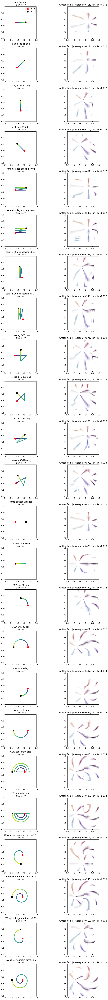

In [23]:
def plot_local_cases(df_local, local_saved, max_cases=None):
    if max_cases is not None:
        df_plot = df_local.head(max_cases).copy()
    else:
        df_plot = df_local.copy()

    n = len(df_plot)

    fig, axes = plt.subplots(n, 2, figsize=(12, 3.4*n), squeeze=False)

    for i, row in df_plot.iterrows():
        name = row["name"]
        data = local_saved[name]

        x = data["x"]
        y = data["y"]
        X = data["X"]
        Y = data["Y"]
        Px = data["Px"]
        Py = data["Py"]

        # trajectory
        ax = axes[i, 0]

        progress = np.linspace(0, 1, len(x))

        ax.scatter(x, y, c=progress, cmap="viridis", s=8)
        ax.plot(x, y, color="gray", lw=0.7, alpha=0.35)
        ax.scatter(x[0], y[0], color="red", marker="o", s=70, label="start")
        ax.scatter(x[-1], y[-1], color="black", marker="X", s=90, label="end")

        ax.set_aspect("equal")
        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)
        ax.set_title(f"{name}\ntrajectory")

        if i == 0:
            ax.legend()

        # written field
        ax = axes[i, 1]
        s = slice(None, None, 3)
        angle = np.arctan2(Py, Px)

        ax.quiver(
            X[s, s],
            Y[s, s],
            Px[s, s],
            Py[s, s],
            angle[s, s],
            cmap="twilight",
            scale=30
        )

        ax.set_aspect("equal")
        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)

        ax.set_title(
            f"written field | coverage={row['coverage']:.3f}, "
            f"curl-like={row['curl_like']:.3f}"
        )

    plt.tight_layout()
    plt.show()


plot_local_cases(df_local, local_saved)

In [24]:
def target_vortex(X, Y, center=(0.5, 0.5), clockwise=False):
    cx, cy = center

    Tx = -(Y - cy)
    Ty =  (X - cx)

    if clockwise:
        Tx, Ty = -Tx, -Ty

    mag = np.hypot(Tx, Ty) + 1e-12

    return Tx / mag, Ty / mag


def evaluate_vortex_quality(Px, Py, X, Y, target_clockwise=False):
    Tx, Ty = target_vortex(X, Y, clockwise=target_clockwise)

    R = np.hypot(X - 0.5, Y - 0.5)

    roi = (R > 0.08) & (R < 0.45)
    written = np.isfinite(Px) & np.isfinite(Py)
    valid = roi & written

    coverage = valid.sum() / roi.sum()

    if valid.sum() == 0:
        return {
            "quality": 0.0,
            "coverage": 0.0,
            "alignment": -1.0,
            "angle_error_deg": 180.0
        }

    dot = Px[valid] * Tx[valid] + Py[valid] * Ty[valid]
    dot = np.clip(dot, -1, 1)

    alignment = float(np.mean(dot))
    angle_error = float(np.degrees(np.mean(np.arccos(dot))))

    direction_score = (alignment + 1) / 2
    quality = float(coverage * direction_score)

    return {
        "quality": quality,
        "coverage": float(coverage),
        "alignment": alignment,
        "angle_error_deg": angle_error
    }


def winding_number(Px, Py, X, Y, center=(0.5, 0.5), radius=0.32, n=240):
    cx, cy = center

    theta = np.linspace(0, 2*np.pi, n, endpoint=False)
    xs = cx + radius * np.cos(theta)
    ys = cy + radius * np.sin(theta)

    xgrid = X[0, :]
    ygrid = Y[:, 0]

    angles = []

    for x, y in zip(xs, ys):
        ix = np.argmin(np.abs(xgrid - x))
        iy = np.argmin(np.abs(ygrid - y))

        px = Px[iy, ix]
        py = Py[iy, ix]

        if np.isfinite(px) and np.isfinite(py):
            angles.append(np.arctan2(py, px))
        else:
            angles.append(np.nan)

    angles = np.array(angles)
    valid = np.isfinite(angles)

    if valid.mean() < 0.6:
        return np.nan

    idx = np.arange(n)
    angles_filled = np.interp(idx, idx[valid], angles[valid])
    angles_unwrapped = np.unwrap(angles_filled)

    return float((angles_unwrapped[-1] - angles_unwrapped[0]) / (2*np.pi))

In [25]:
def circle_path(radius=0.35, n=500, clockwise=True):
    t = np.linspace(0, 1, n, endpoint=False)
    theta = 2 * np.pi * t

    if clockwise:
        theta = -theta

    x = 0.5 + radius * np.cos(theta)
    y = 0.5 + radius * np.sin(theta)
    V = np.ones_like(x)

    return x, y, V


def spiral_path(r0=0.06, r1=0.44, turns=4, n=800, clockwise=True):
    t = np.linspace(0, 1, n)
    theta = 2 * np.pi * turns * t

    if clockwise:
        theta = -theta

    r = r0 + (r1 - r0) * t

    x = 0.5 + r * np.cos(theta)
    y = 0.5 + r * np.sin(theta)
    V = np.ones_like(x)

    return x, y, V


def multi_ring_path(radii, n_per_ring=220, clockwise=True):
    paths = []

    for j, r in enumerate(radii):
        theta = np.linspace(0, 2*np.pi, n_per_ring, endpoint=False)

        if clockwise:
            theta = -theta

        theta = theta + j*np.pi/12

        x = 0.5 + r*np.cos(theta)
        y = 0.5 + r*np.sin(theta)
        V = np.ones_like(x)

        paths.append((x, y, V))

    return connect_paths(paths)


def build_full_candidate_pool():
    rows = []

    # circles
    for r in np.linspace(0.18, 0.44, 14):
        x, y, V = circle_path(radius=r)
        rows.append({
            "name": f"circle_r={r:.3f}",
            "family": "circle",
            "family_code": 0,
            "radius": r,
            "r0": 0.0,
            "r1": r,
            "turns": 1.0,
            "nrings": 1,
            "path_length_est": trajectory_length(x, y)
        })

    # spirals
    for turns in np.linspace(1.5, 7.0, 12):
        for r1 in np.linspace(0.30, 0.45, 6):
            x, y, V = spiral_path(r0=0.05, r1=r1, turns=turns)
            rows.append({
                "name": f"spiral_turns={turns:.2f}_r1={r1:.2f}",
                "family": "spiral",
                "family_code": 1,
                "radius": r1,
                "r0": 0.05,
                "r1": r1,
                "turns": turns,
                "nrings": 1,
                "path_length_est": trajectory_length(x, y)
            })

    # multi-rings
    for nrings in range(2, 8):
        for r1 in np.linspace(0.30, 0.45, 6):
            radii = np.linspace(0.10, r1, nrings)
            x, y, V = multi_ring_path(radii)
            rows.append({
                "name": f"rings_n={nrings}_r1={r1:.2f}",
                "family": "rings",
                "family_code": 2,
                "radius": r1,
                "r0": 0.10,
                "r1": r1,
                "turns": 1.0,
                "nrings": nrings,
                "path_length_est": trajectory_length(x, y)
            })

    df = pd.DataFrame(rows)

    df["path_length_norm"] = (
        df["path_length_est"] - df["path_length_est"].min()
    ) / (
        df["path_length_est"].max() - df["path_length_est"].min()
    )

    return df


candidate_pool = build_full_candidate_pool()

print("Full trajectory candidate count:", len(candidate_pool))
display(candidate_pool.head())

Full trajectory candidate count: 122


,name,family,family_code,radius,r0,r1,turns,nrings,path_length_est,path_length_norm
0,circle_r=0.180,circle,0,0.18,0.0,0.18,1.0,1,1.128704,0.000000
1,circle_r=0.200,circle,0,0.20,0.0,0.20,1.0,1,1.254116,0.010965
2,circle_r=0.220,circle,0,0.22,0.0,0.22,1.0,1,1.379527,0.021929
3,circle_r=0.240,circle,0,0.24,0.0,0.24,1.0,1,1.504939,0.032894
4,circle_r=0.260,circle,0,0.26,0.0,0.26,1.0,1,1.630350,0.043858


In [27]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, WhiteKernel, ConstantKernel
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

feature_cols = [
    "family_code",
    "radius",
    "r0",
    "r1",
    "turns",
    "nrings",
    "path_length_norm"
]

def make_path_from_candidate(row):
    if row["family"] == "circle":
        return circle_path(radius=row["radius"])

    if row["family"] == "spiral":
        return spiral_path(r0=row["r0"], r1=row["r1"], turns=row["turns"])

    if row["family"] == "rings":
        radii = np.linspace(row["r0"], row["r1"], int(row["nrings"]))
        return multi_ring_path(radii)

    raise ValueError("Unknown family")


def run_full_virtual_experiment(row, cost_penalty=0.25):
    x, y, V = make_path_from_candidate(row)

    X, Y, Px, Py = simulate_written_field(x, y, V, N=90)

    metrics = evaluate_vortex_quality(Px, Py, X, Y)

    w = winding_number(Px, Py, X, Y)
    L = trajectory_length(x, y)

    objective = metrics["quality"] - cost_penalty * row["path_length_norm"]

    result = {
        "name": row["name"],
        "family": row["family"],
        "family_code": row["family_code"],
        "radius": row["radius"],
        "r0": row["r0"],
        "r1": row["r1"],
        "turns": row["turns"],
        "nrings": row["nrings"],
        "path_length": L,
        "path_length_norm": row["path_length_norm"],
        "quality": metrics["quality"],
        "coverage": metrics["coverage"],
        "alignment": metrics["alignment"],
        "angle_error_deg": metrics["angle_error_deg"],
        "winding_number": w,
        "objective": objective
    }

    saved = {
        "x": x,
        "y": y,
        "V": V,
        "X": X,
        "Y": Y,
        "Px": Px,
        "Py": Py
    }

    return result, saved


def get_features(df):
    return df[feature_cols].values.astype(float)

In [28]:
np.random.seed(4)

# Diverse initial choices, inspired by the local calibration set:
# one circle, one short spiral, one long spiral, one few-ring, one many-ring.
initial_indices = []

initial_indices.append(candidate_pool[candidate_pool["family"] == "circle"].sample(1, random_state=1).index[0])
initial_indices.append(candidate_pool[(candidate_pool["family"] == "spiral") & (candidate_pool["turns"] < 2.5)].sample(1, random_state=2).index[0])
initial_indices.append(candidate_pool[(candidate_pool["family"] == "spiral") & (candidate_pool["turns"] > 5.5)].sample(1, random_state=3).index[0])
initial_indices.append(candidate_pool[(candidate_pool["family"] == "rings") & (candidate_pool["nrings"] <= 3)].sample(1, random_state=4).index[0])
initial_indices.append(candidate_pool[(candidate_pool["family"] == "rings") & (candidate_pool["nrings"] >= 6)].sample(1, random_state=5).index[0])

all_results = []
all_saved = {}

for idx in initial_indices:
    row = candidate_pool.loc[idx]
    result, saved = run_full_virtual_experiment(row)

    all_results.append(result)
    all_saved[result["name"]] = saved

print("Initial full-trajectory tests:")
display(pd.DataFrame(all_results))

Initial full-trajectory tests:


,name,family,family_code,radius,r0,r1,turns,nrings,path_length,path_length_norm,quality,coverage,alignment,angle_error_deg,winding_number,objective
0,circle_r=0.240,circle,0,0.24,0.00,0.24,1.0,1,1.504939,0.032894,0.730065,1.0,0.460130,60.388235,1.000000e+00,0.721842
1,spiral_turns=2.00_r1=0.39,spiral,1,0.39,0.05,0.39,2.0,1,2.791906,0.145412,0.838465,1.0,0.676930,40.111134,-1.413580e-16,0.802112
2,spiral_turns=6.50_r1=0.45,spiral,1,0.45,0.05,0.45,6.5,1,10.219796,0.794825,0.870729,1.0,0.741458,32.608065,1.000000e+00,0.672023
3,rings_n=2_r1=0.39,rings,2,0.39,0.10,0.39,1.0,2,3.358281,0.194930,0.844155,1.0,0.688311,36.876442,0.000000e+00,0.795423
4,rings_n=7_r1=0.33,rings,2,0.33,0.10,0.33,1.0,7,9.794408,0.757634,0.823687,1.0,0.647375,42.106194,0.000000e+00,0.634279


In [29]:
n_active_steps = 8
beta = 1.5

for step in range(n_active_steps):
    df_obs = pd.DataFrame(all_results)
    evaluated = set(df_obs["name"])

    df_unseen = candidate_pool[~candidate_pool["name"].isin(evaluated)].copy()

    X_train = get_features(df_obs)
    y_train = df_obs["objective"].values

    X_pool = get_features(df_unseen)

    kernel = (
        ConstantKernel(1.0, (1e-3, 1e3))
        * Matern(length_scale=np.ones(X_train.shape[1]), nu=2.5)
        + WhiteKernel(noise_level=1e-4)
    )

    model = make_pipeline(
        StandardScaler(),
        GaussianProcessRegressor(
            kernel=kernel,
            normalize_y=True,
            n_restarts_optimizer=3,
            random_state=step
        )
    )

    model.fit(X_train, y_train)

    mu, sigma = model.predict(X_pool, return_std=True)

    acquisition = mu + beta * sigma

    chosen = df_unseen.iloc[np.argmax(acquisition)]

    result, saved = run_full_virtual_experiment(chosen)

    all_results.append(result)
    all_saved[result["name"]] = saved

    print(
        f"Step {step+1}: tested {result['name']} | "
        f"quality={result['quality']:.3f}, "
        f"objective={result['objective']:.3f}, "
        f"winding={result['winding_number']:.2f}"
    )

df_active = pd.DataFrame(all_results)

df_active_ranked = df_active.sort_values("objective", ascending=False).reset_index(drop=True)

display(df_active_ranked)

/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 2 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 4 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:

Step 1: tested spiral_turns=1.50_r1=0.45 | quality=0.861, objective=0.833, winding=0.00


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 2 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


Step 2: tested spiral_turns=2.00_r1=0.45 | quality=0.874, objective=0.829, winding=-0.00


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 2 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


Step 3: tested circle_r=0.440 | quality=0.782, objective=0.746, winding=1.00


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 4 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 5 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


Step 4: tested rings_n=2_r1=0.45 | quality=0.825, objective=0.767, winding=1.00


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 5 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 6 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


Step 5: tested rings_n=3_r1=0.30 | quality=0.797, objective=0.735, winding=1.00


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 4 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 5 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


Step 6: tested spiral_turns=1.50_r1=0.42 | quality=0.844, objective=0.819, winding=0.00


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


Step 7: tested rings_n=4_r1=0.30 | quality=0.798, objective=0.708, winding=1.00


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 4 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


Step 8: tested spiral_turns=2.50_r1=0.45 | quality=0.879, objective=0.817, winding=0.00


,name,family,family_code,radius,r0,r1,turns,nrings,path_length,path_length_norm,quality,coverage,alignment,angle_error_deg,winding_number,objective
0,spiral_turns=1.50_r1=0.45,spiral,1,0.45,0.05,0.45,1.5,1,2.401187,0.111252,0.860803,1.000000,0.721607,36.226268,0.000000e+00,0.832990
1,spiral_turns=2.00_r1=0.45,spiral,1,0.45,0.05,0.45,2.0,1,3.175802,0.178976,0.874034,1.000000,0.748067,32.930326,-1.413580e-16,0.829290
2,spiral_turns=1.50_r1=0.42,spiral,1,0.42,0.05,0.42,1.5,1,2.255280,0.098495,0.843882,1.000000,0.687765,39.465372,0.000000e+00,0.819258
3,spiral_turns=2.50_r1=0.45,spiral,1,0.45,0.05,0.45,2.5,1,3.954518,0.247058,0.878772,1.000000,0.757544,31.490270,0.000000e+00,0.817008
4,spiral_turns=2.00_r1=0.39,spiral,1,0.39,0.05,0.39,2.0,1,2.791906,0.145412,0.838465,1.000000,0.676930,40.111134,-1.413580e-16,0.802112
5,rings_n=2_r1=0.39,rings,2,0.39,0.10,0.39,1.0,2,3.358281,0.194930,0.844155,1.000000,0.688311,36.876442,0.000000e+00,0.795423
6,rings_n=2_r1=0.45,rings,2,0.45,0.10,0.45,1.0,2,3.793391,0.232971,0.825152,1.000000,0.650305,38.679355,1.000000e+00,0.766910
7,circle_r=0.440,circle,0,0.44,0.00,0.44,1.0,1,2.759054,0.142540,0.781589,0.900738,0.735441,32.051952,1.000000e+00,0.745954
8,rings_n=3_r1=0.30,rings,2,0.30,0.10,0.30,1.0,3,3.973029,0.248676,0.796771,1.000000,0.593542,47.658271,1.000000e+00,0.734602
9,circle_r=0.240,circle,0,0.24,0.00,0.24,1.0,1,1.504939,0.032894,0.730065,1.000000,0.460130,60.388235,1.000000e+00,0.721842


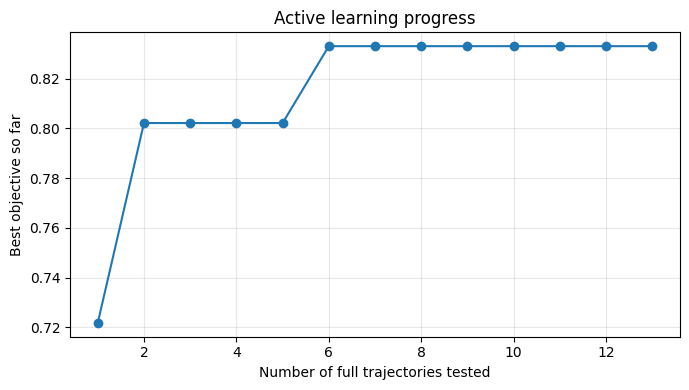

In [30]:
plt.figure(figsize=(7, 4))

best_so_far = df_active["objective"].cummax()

plt.plot(np.arange(1, len(best_so_far)+1), best_so_far, marker="o")

plt.xlabel("Number of full trajectories tested")
plt.ylabel("Best objective so far")
plt.title("Active learning progress")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

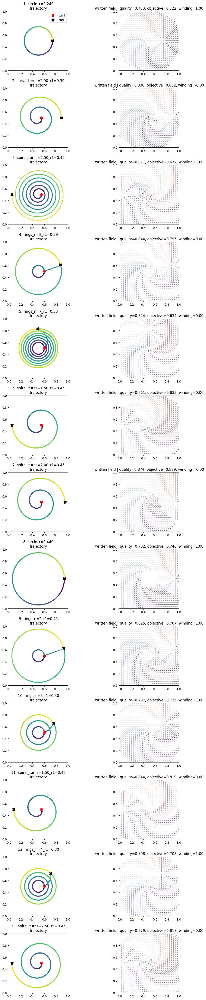

In [31]:
def plot_active_learning_cases(df_active, all_saved):
    n = len(df_active)

    fig, axes = plt.subplots(n, 2, figsize=(12, 3.6*n), squeeze=False)

    for i, row in df_active.iterrows():
        data = all_saved[row["name"]]

        x = data["x"]
        y = data["y"]
        X = data["X"]
        Y = data["Y"]
        Px = data["Px"]
        Py = data["Py"]

        # trajectory
        ax = axes[i, 0]

        progress = np.linspace(0, 1, len(x))

        ax.scatter(x, y, c=progress, cmap="viridis", s=6)
        ax.plot(x, y, color="gray", alpha=0.25, lw=0.6)

        ax.scatter(x[0], y[0], color="red", marker="o", s=70, label="start")
        ax.scatter(x[-1], y[-1], color="black", marker="X", s=90, label="end")

        ax.set_aspect("equal")
        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)
        ax.set_title(f"{i+1}. {row['name']}\ntrajectory")

        if i == 0:
            ax.legend()

        # written field
        ax = axes[i, 1]

        s = slice(None, None, 3)
        angle = np.arctan2(Py, Px)

        ax.quiver(
            X[s, s],
            Y[s, s],
            Px[s, s],
            Py[s, s],
            angle[s, s],
            cmap="twilight",
            scale=30
        )

        ax.set_aspect("equal")
        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)

        ax.set_title(
            f"written field | quality={row['quality']:.3f}, "
            f"objective={row['objective']:.3f}, "
            f"winding={row['winding_number']:.2f}"
        )

    plt.tight_layout()
    plt.show()


plot_active_learning_cases(df_active, all_saved)

## Primitive-based inverse design of a vortex-writing trajectory

In the original notebook, a moving biased AFM tip writes a local in-plane vector field according to a simplified point-charge field model. Instead of manually choosing one full trajectory such as a circle or spiral, here we try a more modular strategy.

The idea is:

1. Define a target vortex vector field.
2. Define a library of short writing primitives:
   - short arcs
   - half arcs
   - spiral fragments
   - short correction lines
3. Build a full trajectory by combining these primitives.
4. After each candidate combination, use the notebook's forward model to simulate the written field.
5. Score the written field against the target vortex.
6. Use beam search to keep only the best partial trajectories at each stage.

This is closer to a realistic AFM workflow because full vortex writes are expensive. In a real experiment, the short primitives could be calibrated experimentally first, and then combined virtually to design a final full trajectory.

In [32]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# ============================================================
# Same style as the notebook: point-charge field + overwrite
# ============================================================

h = 0.06       # effective tip height
Ec = 12.0      # switching threshold

def Efield(X, Y, xc, yc, V):
    """
    In-plane electric field from a simplified biased tip.
    This follows the same point-charge style model used in the notebook.
    """
    dx = X - xc
    dy = Y - yc
    r3 = (dx*dx + dy*dy + h*h)**1.5

    Ex = V * dx / r3
    Ey = V * dy / r3

    return Ex, Ey


def simulate_written_field(xc, yc, V, N=70):
    """
    Forward simulation.

    The tip moves through positions (xc, yc) with voltage V.
    Wherever |E| > Ec, the local vector field is overwritten by
    the current field direction.

    Voltage V = 0 means connector movement with no writing.
    """
    g = np.linspace(0, 1, N)
    X, Y = np.meshgrid(g, g)

    Px = np.full_like(X, np.nan, dtype=float)
    Py = np.full_like(Y, np.nan, dtype=float)

    for i in range(len(xc)):
        if V[i] == 0:
            continue

        Ex, Ey = Efield(X, Y, xc[i], yc[i], V[i])
        mag = np.hypot(Ex, Ey)

        switched = mag > Ec

        Px[switched] = Ex[switched] / mag[switched]
        Py[switched] = Ey[switched] / mag[switched]

    return X, Y, Px, Py


def trajectory_length(x, y):
    return float(np.sum(np.hypot(np.diff(x), np.diff(y))))


def connect_paths(paths, connector_points=20):
    """
    Connect multiple primitives into one trajectory.
    Connector movements use V = 0, so they move the tip without writing.
    """
    xs, ys, Vs = [], [], []

    prev_x, prev_y = None, None

    for x, y, V in paths:
        if prev_x is not None:
            cx = np.linspace(prev_x, x[0], connector_points)
            cy = np.linspace(prev_y, y[0], connector_points)
            cV = np.zeros(connector_points)

            xs.append(cx)
            ys.append(cy)
            Vs.append(cV)

        xs.append(x)
        ys.append(y)
        Vs.append(V)

        prev_x = x[-1]
        prev_y = y[-1]

    return np.concatenate(xs), np.concatenate(ys), np.concatenate(Vs)

In [33]:
def target_vortex(X, Y, center=(0.5, 0.5), clockwise=False):
    """
    Synthetic target vortex field.
    """
    cx, cy = center

    Tx = -(Y - cy)
    Ty =  (X - cx)

    if clockwise:
        Tx, Ty = -Tx, -Ty

    mag = np.hypot(Tx, Ty) + 1e-12

    return Tx / mag, Ty / mag


def evaluate_vortex_quality(Px, Py, X, Y, target_clockwise=False):
    """
    Compare written vector field to a target vortex.
    """
    Tx, Ty = target_vortex(X, Y, clockwise=target_clockwise)

    R = np.hypot(X - 0.5, Y - 0.5)

    # Avoid the exact center, where vortex direction is undefined.
    # Avoid the outermost boundary, where edge effects dominate.
    roi = (R > 0.08) & (R < 0.46)

    written = np.isfinite(Px) & np.isfinite(Py)
    valid = roi & written

    coverage = valid.sum() / roi.sum()

    if valid.sum() == 0:
        return {
            "quality": 0.0,
            "coverage": 0.0,
            "alignment": -1.0,
            "angle_error_deg": 180.0
        }

    dot = Px[valid] * Tx[valid] + Py[valid] * Ty[valid]
    dot = np.clip(dot, -1, 1)

    alignment = float(np.mean(dot))
    angle_error = float(np.degrees(np.mean(np.arccos(dot))))

    # Convert alignment from [-1, 1] to [0, 1]
    direction_score = (alignment + 1) / 2

    quality = float(coverage * direction_score)

    return {
        "quality": quality,
        "coverage": float(coverage),
        "alignment": alignment,
        "angle_error_deg": angle_error
    }


def winding_number(Px, Py, X, Y, center=(0.5, 0.5), radius=0.32, n=240):
    """
    Estimate topological winding number around a circular loop.
    A vortex-like field should have winding close to +1 or -1.
    """
    cx, cy = center

    theta = np.linspace(0, 2*np.pi, n, endpoint=False)
    xs = cx + radius * np.cos(theta)
    ys = cy + radius * np.sin(theta)

    xgrid = X[0, :]
    ygrid = Y[:, 0]

    angles = []

    for x, y in zip(xs, ys):
        ix = np.argmin(np.abs(xgrid - x))
        iy = np.argmin(np.abs(ygrid - y))

        px = Px[iy, ix]
        py = Py[iy, ix]

        if np.isfinite(px) and np.isfinite(py):
            angles.append(np.arctan2(py, px))
        else:
            angles.append(np.nan)

    angles = np.array(angles)
    valid = np.isfinite(angles)

    if valid.mean() < 0.6:
        return np.nan

    idx = np.arange(n)
    angles_filled = np.interp(idx, idx[valid], angles[valid])
    angles_unwrapped = np.unwrap(angles_filled)

    total_rotation = angles_unwrapped[-1] - angles_unwrapped[0]

    return float(total_rotation / (2*np.pi))


def winding_score_from_number(w):
    """
    Convert winding number into a bounded score.
    Best value is when abs(w) is close to 1.
    """
    if not np.isfinite(w):
        return 0.0

    return max(0.0, 1.0 - abs(abs(w) - 1.0))


def objective_from_written_field(Px, Py, X, Y, path_length, n_primitives):
    """
    Final objective used by beam search.
    """
    metrics = evaluate_vortex_quality(Px, Py, X, Y)
    w = winding_number(Px, Py, X, Y)
    wscore = winding_score_from_number(w)

    objective = (
        metrics["quality"]
        + 0.05 * wscore
        - 0.03 * path_length
        - 0.02 * n_primitives
    )

    return objective, metrics, w, wscore

In [34]:
def arc_primitive(radius=0.3, theta0=0.0, span=np.pi/2, clockwise=True, n=70, Vwrite=1.0):
    """
    Circular arc segment.
    """
    if clockwise:
        theta = theta0 - np.linspace(0, span, n)
    else:
        theta = theta0 + np.linspace(0, span, n)

    x = 0.5 + radius * np.cos(theta)
    y = 0.5 + radius * np.sin(theta)
    V = np.full_like(x, Vwrite)

    return x, y, V


def spiral_primitive(r0=0.12, r1=0.32, theta0=0.0, turns=0.75, clockwise=True, n=90, Vwrite=1.0):
    """
    Short spiral fragment.
    """
    t = np.linspace(0, 1, n)

    if clockwise:
        theta = theta0 - 2*np.pi*turns*t
    else:
        theta = theta0 + 2*np.pi*turns*t

    r = r0 + (r1 - r0) * t

    x = 0.5 + r * np.cos(theta)
    y = 0.5 + r * np.sin(theta)
    V = np.full_like(x, Vwrite)

    return x, y, V


def tangent_line_primitive(radius=0.3, theta0=0.0, length=0.22, clockwise=True, n=60, Vwrite=1.0):
    """
    Short tangent-line correction near a circular shell.
    """
    cx = 0.5 + radius * np.cos(theta0)
    cy = 0.5 + radius * np.sin(theta0)

    # Tangent direction
    if clockwise:
        tx =  np.sin(theta0)
        ty = -np.cos(theta0)
    else:
        tx = -np.sin(theta0)
        ty =  np.cos(theta0)

    s = np.linspace(-0.5, 0.5, n)

    x = cx + length * s * tx
    y = cy + length * s * ty
    V = np.full_like(x, Vwrite)

    return x, y, V


def build_primitive_library():
    primitives = []

    # ------------------------------------------------------------
    # Quarter arcs at several radii and angular sectors
    # ------------------------------------------------------------
    radii = [0.16, 0.26, 0.36, 0.44]
    theta_starts = np.deg2rad([0, 90, 180, 270])

    for r in radii:
        for theta0 in theta_starts:
            for clockwise in [True, False]:
                x, y, V = arc_primitive(
                    radius=r,
                    theta0=theta0,
                    span=np.pi/2,
                    clockwise=clockwise,
                    n=70
                )

                direction = "CW" if clockwise else "CCW"

                primitives.append({
                    "name": f"{direction} quarter arc r={r:.2f} th={np.rad2deg(theta0):.0f}",
                    "type": "quarter_arc",
                    "x": x,
                    "y": y,
                    "V": V
                })

    # ------------------------------------------------------------
    # Half arcs
    # ------------------------------------------------------------
    for r in [0.22, 0.38]:
        for theta0 in np.deg2rad([0, 180]):
            for clockwise in [True, False]:
                x, y, V = arc_primitive(
                    radius=r,
                    theta0=theta0,
                    span=np.pi,
                    clockwise=clockwise,
                    n=100
                )

                direction = "CW" if clockwise else "CCW"

                primitives.append({
                    "name": f"{direction} half arc r={r:.2f} th={np.rad2deg(theta0):.0f}",
                    "type": "half_arc",
                    "x": x,
                    "y": y,
                    "V": V
                })

    # ------------------------------------------------------------
    # Short spiral fragments
    # ------------------------------------------------------------
    spiral_specs = [
        (0.08, 0.24, 0),
        (0.08, 0.24, 180),
        (0.22, 0.44, 90),
        (0.22, 0.44, 270),
    ]

    for r0, r1, deg in spiral_specs:
        for clockwise in [True, False]:
            x, y, V = spiral_primitive(
                r0=r0,
                r1=r1,
                theta0=np.deg2rad(deg),
                turns=0.75,
                clockwise=clockwise,
                n=90
            )

            direction = "CW" if clockwise else "CCW"

            primitives.append({
                "name": f"{direction} spiral r={r0:.2f}->{r1:.2f} th={deg}",
                "type": "spiral_fragment",
                "x": x,
                "y": y,
                "V": V
            })

    # ------------------------------------------------------------
    # Tangent correction lines
    # ------------------------------------------------------------
    for r in [0.24, 0.38]:
        for theta0 in np.deg2rad([45, 135, 225, 315]):
            for clockwise in [True, False]:
                x, y, V = tangent_line_primitive(
                    radius=r,
                    theta0=theta0,
                    clockwise=clockwise,
                    n=60
                )

                direction = "CW" if clockwise else "CCW"

                primitives.append({
                    "name": f"{direction} tangent line r={r:.2f} th={np.rad2deg(theta0):.0f}",
                    "type": "tangent_line",
                    "x": x,
                    "y": y,
                    "V": V
                })

    return primitives


primitive_library = build_primitive_library()

print("Number of available primitives:", len(primitive_library))
pd.DataFrame([
    {"id": i, "name": p["name"], "type": p["type"]}
    for i, p in enumerate(primitive_library)
]).head(15)

Number of available primitives: 64


,id,name,type
0,0,CW quarter arc r=0.16 th=0,quarter_arc
1,1,CCW quarter arc r=0.16 th=0,quarter_arc
2,2,CW quarter arc r=0.16 th=90,quarter_arc
3,3,CCW quarter arc r=0.16 th=90,quarter_arc
4,4,CW quarter arc r=0.16 th=180,quarter_arc
5,5,CCW quarter arc r=0.16 th=180,quarter_arc
6,6,CW quarter arc r=0.16 th=270,quarter_arc
7,7,CCW quarter arc r=0.16 th=270,quarter_arc
8,8,CW quarter arc r=0.26 th=0,quarter_arc
9,9,CCW quarter arc r=0.26 th=0,quarter_arc


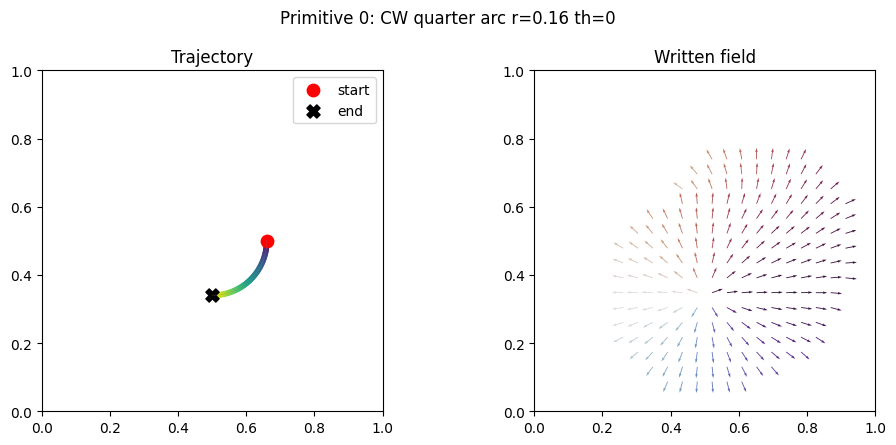

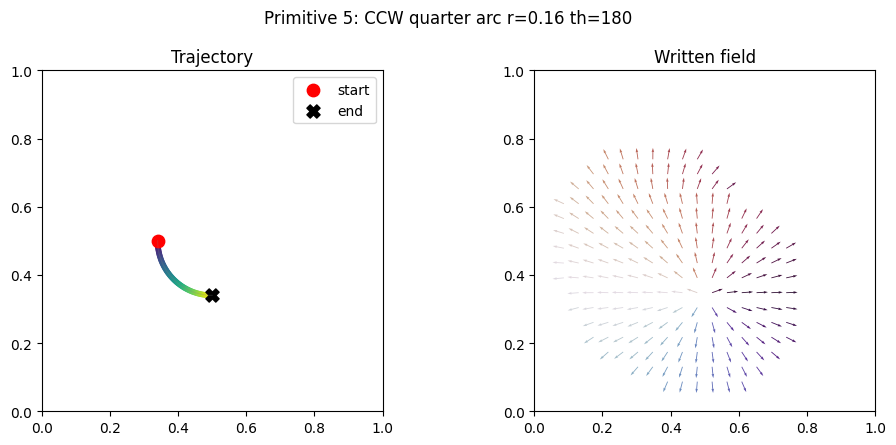

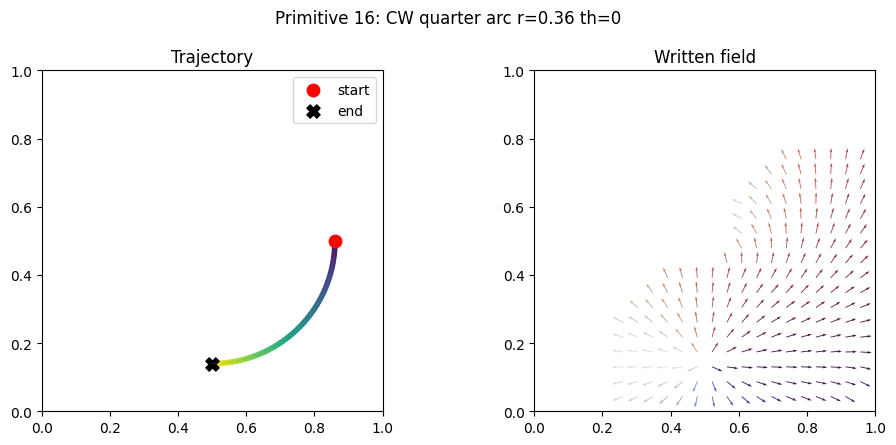

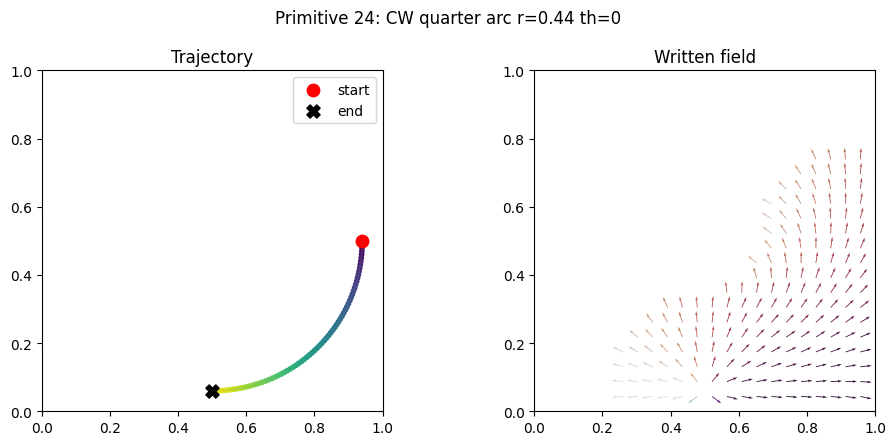

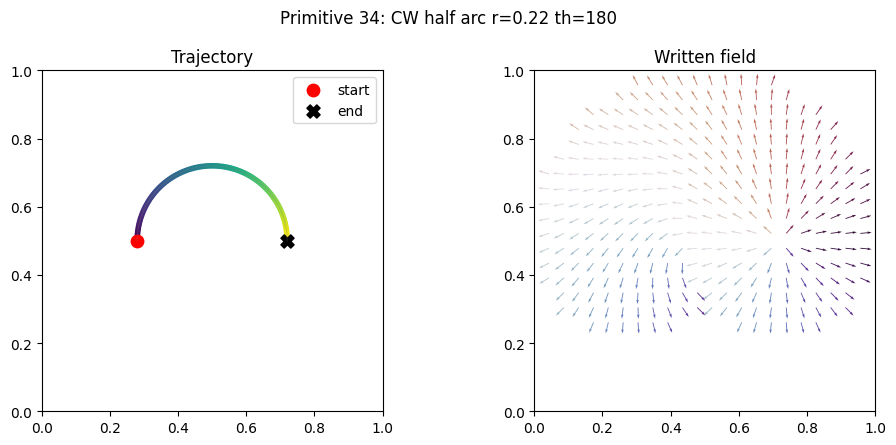

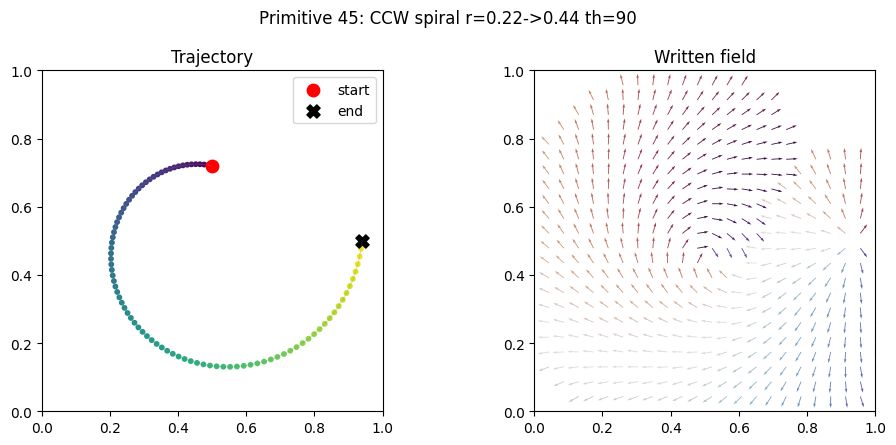

In [35]:
def plot_single_trajectory_and_field(x, y, X, Y, Px, Py, title=""):
    fig, ax = plt.subplots(1, 2, figsize=(10, 4.5))

    progress = np.linspace(0, 1, len(x))

    ax[0].scatter(x, y, c=progress, cmap="viridis", s=10)
    ax[0].plot(x, y, color="gray", alpha=0.25, lw=0.8)
    ax[0].scatter(x[0], y[0], color="red", marker="o", s=80, label="start")
    ax[0].scatter(x[-1], y[-1], color="black", marker="X", s=90, label="end")
    ax[0].set_title("Trajectory")
    ax[0].legend()

    s = slice(None, None, 3)
    angle = np.arctan2(Py, Px)

    ax[1].quiver(
        X[s, s],
        Y[s, s],
        Px[s, s],
        Py[s, s],
        angle[s, s],
        cmap="twilight",
        scale=30
    )
    ax[1].set_title("Written field")

    for a in ax:
        a.set_aspect("equal")
        a.set_xlim(0, 1)
        a.set_ylim(0, 1)

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()


# Plot a few representative primitives
example_ids = [0, 5, 16, 24, 34, 45]

for pid in example_ids:
    p = primitive_library[pid]
    x, y, V = p["x"], p["y"], p["V"]

    X, Y, Px, Py = simulate_written_field(x, y, V, N=70)

    plot_single_trajectory_and_field(
        x, y, X, Y, Px, Py,
        title=f"Primitive {pid}: {p['name']}"
    )

### Beam search over primitive sequences

Beam search builds a trajectory step by step.

At each step:

1. Take the current best partial trajectories.
2. Try adding every possible primitive from the library.
3. Simulate the resulting written field.
4. Score the written field against the target vortex.
5. Keep only the top `beam_width` partial trajectories.

This is more flexible than selecting from a fixed set of full trajectories because the final path can be a mixture of arcs, spiral fragments, and correction lines.

### How the trajectory is scored

After a candidate trajectory is generated, the forward simulator calculates the written vector field:

$$
(P_x, P_y)
$$

This written field is compared against a target vortex field:

$$
(T_x, T_y)
$$

The scoring has three main parts:

1. **quality**
2. **winding number**
3. **objective**

---

# 1. Vortex quality

The quality score measures how well the written field locally matches the target vortex.

The target vortex is defined as:

$$
T_x = -(Y-y_c)
$$

$$
T_y = X-x_c
$$

The target field is then normalized so that every vector has unit length:

$$
\sqrt{T_x^2 + T_y^2} = 1
$$

The written field is also treated as a unit vector field.

We evaluate the score only in an annular region around the center:

$$
0.08 < R < 0.46
$$

where

$$
R = \sqrt{(X-x_c)^2 + (Y-y_c)^2}
$$

This avoids the exact vortex center, where the direction is undefined, and avoids edge effects near the image boundary.

---

## Coverage

Coverage measures how much of the target region was actually written:

$$
\text{coverage}
=
\frac{
\text{number of written pixels inside ROI}
}{
\text{total number of pixels inside ROI}
}
$$

A coverage value of 1 means the entire scoring region was written.

A coverage value of 0 means nothing was written in the scoring region.

---

## Alignment

Alignment measures whether the written vectors point in the same direction as the target vortex vectors.

For every written pixel, we compute the dot product:

$$
\text{dot}
=
P_xT_x + P_yT_y
$$

Because both vectors are normalized:

| Dot product | Meaning |
|---:|---|
| 1 | perfect direction match |
| 0 | perpendicular direction |
| -1 | opposite direction |

The alignment is the average dot product over all valid written pixels:

$$
\text{alignment}
=
\left\langle P_xT_x + P_yT_y \right\rangle
$$

---

## Direction score

The alignment ranges from -1 to +1, so we convert it to a 0-to-1 direction score:

$$
\text{direction score}
=
\frac{\text{alignment}+1}{2}
$$

So:

$$
\text{alignment}=1
\Rightarrow
\text{direction score}=1
$$

$$
\text{alignment}=0
\Rightarrow
\text{direction score}=0.5
$$

$$
\text{alignment}=-1
\Rightarrow
\text{direction score}=0
$$

---

## Final quality score

The final vortex quality is:

$$
\boxed{
\text{quality}
=
\text{coverage}
\times
\frac{\text{alignment}+1}{2}
}
$$

This means a trajectory gets a high quality score only if it writes a large part of the target region and the written vectors point in the correct vortex direction.

---

# 2. Winding number

The quality score checks local vector alignment, but it does not fully check whether the pattern has vortex topology.

To estimate whether the written field is truly vortex-like, we calculate a winding number.

The vector angle is:

$$
\theta = \tan^{-1}\left(\frac{P_y}{P_x}\right)
$$

We sample the written vector field along a circular loop around the center. Then we unwrap the vector angle and calculate the total angle rotation around the loop:

$$
\Delta \theta = \theta_{\text{final}} - \theta_{\text{initial}}
$$

The winding number is:

$$
\boxed{
w =
\frac{\Delta \theta}{2\pi}
}
$$

Interpretation:

| Winding number | Meaning |
|---:|---|
| \(w \approx +1\) | counter-clockwise vortex-like field |
| \(w \approx -1\) | clockwise vortex-like field |
| \(w \approx 0\) | not vortex-like |
| non-integer value | partial or noisy vortex-like structure |

The winding number is useful because a field may have decent local alignment but still fail to form a globally rotating vortex.

---

## Winding score

For the objective, we convert the winding number into a score that rewards values close to +1 or -1:

$$
\text{winding score}
=
1 - \left| |w| - 1 \right|
$$

The score is clipped so that it cannot go below 0:

$$
\boxed{
\text{winding score}
=
\max\left(0,\; 1 - \left| |w| - 1 \right|\right)
}
$$

Examples:

| Winding number | Winding score |
|---:|---:|
| +1 | 1 |
| -1 | 1 |
| 0 | 0 |
| 0.5 | 0.5 |
| 1.3 | 0.7 |

This score rewards vortex-like topology regardless of clockwise or counter-clockwise direction.

---

# 3. Objective function

The objective is the final score used by beam search to decide which partial trajectory to keep.

The objective combines:

1. vortex quality,
2. winding score,
3. path length penalty,
4. number-of-primitives penalty.

The objective used in the code is:

$$
\boxed{
\text{objective}
=
\text{quality}
+
0.05 \times \text{winding score}
-
0.03 \times \text{path length}
-
0.02 \times \text{number of primitives}
}
$$

The terms mean:

| Term | Purpose |
|---|---|
| quality | rewards local match to target vortex |
| \(0.05 \times \text{winding score}\) | rewards global vortex-like topology |
| \(-0.03 \times \text{path length}\) | penalizes long writing trajectories |
| \(-0.02 \times \text{number of primitives}\) | penalizes unnecessarily complicated trajectories |

---

# Why use objective instead of quality alone?

Quality alone may favor long trajectories that write a large area.

However, in a real AFM experiment, long trajectories are not always desirable because they can:

- take more time,
- increase tip wear,
- increase sample damage,
- cause more drift,
- overwrite previously written regions.

Therefore, the objective rewards vortex quality but also prefers shorter and simpler trajectories.

---

# Summary

The scoring hierarchy is:

$$
\text{written field}
\rightarrow
\text{quality}
\rightarrow
\text{winding number}
\rightarrow
\text{objective}
$$

where:

$$
\text{quality}
=
\text{coverage}
\times
\frac{\text{alignment}+1}{2}
$$

$$
w =
\frac{\Delta \theta}{2\pi}
$$

$$
\text{objective}
=
\text{quality}
+
0.05 \times \text{winding score}
-
0.03 \times \text{path length}
-
0.02 \times \text{number of primitives}
$$

In simple words:

**quality** checks local agreement with the target vortex.

**winding** checks global vortex-like topology.

**objective** checks whether the trajectory writes a good vortex efficiently.

In [36]:
def sequence_to_path(sequence, primitive_library, connector_points=20):
    """
    Convert a sequence of primitive IDs into one full trajectory.
    """
    paths = []

    for pid in sequence:
        p = primitive_library[pid]
        paths.append((p["x"], p["y"], p["V"]))

    return connect_paths(paths, connector_points=connector_points)


def evaluate_sequence(sequence, primitive_library, N=70, cache=None):
    """
    Simulate and score one primitive sequence.
    """
    key = tuple(sequence)

    if cache is not None and key in cache:
        return cache[key]

    x, y, V = sequence_to_path(sequence, primitive_library)

    X, Y, Px, Py = simulate_written_field(x, y, V, N=N)

    L = trajectory_length(x, y)

    objective, metrics, w, wscore = objective_from_written_field(
        Px, Py, X, Y,
        path_length=L,
        n_primitives=len(sequence)
    )

    result = {
        "sequence": tuple(sequence),
        "objective": objective,
        "quality": metrics["quality"],
        "coverage": metrics["coverage"],
        "alignment": metrics["alignment"],
        "angle_error_deg": metrics["angle_error_deg"],
        "winding_number": w,
        "winding_score": wscore,
        "path_length": L,
        "n_primitives": len(sequence),
        "x": x,
        "y": y,
        "V": V,
        "X": X,
        "Y": Y,
        "Px": Px,
        "Py": Py
    }

    if cache is not None:
        cache[key] = result

    return result


def beam_search_trajectory(
    primitive_library,
    beam_width=5,
    max_steps=5,
    N_search=60,
    allow_repeats=False
):
    """
    Build trajectory by combining primitives.

    beam_width:
        number of partial trajectories kept after each step

    max_steps:
        maximum number of primitives in final trajectory

    allow_repeats:
        if False, the same primitive cannot be used twice in one sequence
    """
    beam = [()]
    history = []
    cache = {}

    for step in range(1, max_steps + 1):
        candidates = []

        for seq in beam:
            used = set(seq)

            for pid in range(len(primitive_library)):
                if (not allow_repeats) and (pid in used):
                    continue

                new_seq = tuple(list(seq) + [pid])

                result = evaluate_sequence(
                    new_seq,
                    primitive_library,
                    N=N_search,
                    cache=cache
                )

                candidates.append(result)

        candidates = sorted(
            candidates,
            key=lambda d: d["objective"],
            reverse=True
        )

        beam = [c["sequence"] for c in candidates[:beam_width]]

        step_df = pd.DataFrame([
            {
                "rank": i + 1,
                "step": step,
                "objective": c["objective"],
                "quality": c["quality"],
                "coverage": c["coverage"],
                "alignment": c["alignment"],
                "winding_number": c["winding_number"],
                "path_length": c["path_length"],
                "sequence": c["sequence"],
                "primitive_names": " | ".join(
                    primitive_library[j]["name"] for j in c["sequence"]
                )
            }
            for i, c in enumerate(candidates[:beam_width])
        ])

        history.append(step_df)

        print(f"\nBeam search step {step}")
        display(step_df)

    final_results = [
        evaluate_sequence(seq, primitive_library, N=N_search, cache=cache)
        for seq in beam
    ]

    final_results = sorted(
        final_results,
        key=lambda d: d["objective"],
        reverse=True
    )

    return final_results, history


final_results, beam_history = beam_search_trajectory(
    primitive_library,
    beam_width=5,
    max_steps=5,
    N_search=60,
    allow_repeats=False
)

best = final_results[0]

print("\nBest sequence:")
print(best["sequence"])

print("\nBest primitive names:")
for pid in best["sequence"]:
    print(f"  {pid}: {primitive_library[pid]['name']}")

print("\nBest scores:")
print({
    "objective": best["objective"],
    "quality": best["quality"],
    "coverage": best["coverage"],
    "alignment": best["alignment"],
    "winding_number": best["winding_number"],
    "path_length": best["path_length"]
})


Beam search step 1


,rank,step,objective,quality,coverage,alignment,winding_number,path_length,sequence,primitive_names
0,1,1,0.759973,0.827102,0.979167,0.689400,-1.413580e-16,1.570980,"(46,)",CW spiral r=0.22->0.44 th=270
1,2,1,0.759973,0.827102,0.979167,0.689400,0.000000e+00,1.570980,"(44,)",CW spiral r=0.22->0.44 th=90
2,3,1,0.575063,0.565796,0.823582,0.373990,1.000000e+00,0.691121,"(32,)",CW half arc r=0.22 th=0
3,4,1,0.575063,0.565796,0.823582,0.373990,1.000000e+00,0.691121,"(34,)",CW half arc r=0.22 th=180
4,5,1,0.566618,0.559784,0.845745,0.323767,1.000000e+00,0.772210,"(40,)",CW spiral r=0.08->0.24 th=0



Beam search step 2


,rank,step,objective,quality,coverage,alignment,winding_number,path_length,sequence,primitive_names
0,1,2,0.754166,0.862030,0.994681,0.733279,0.0,2.262115,"(46, 24)",CW spiral r=0.22->0.44 th=270 | CW quarter arc...
1,2,2,0.754166,0.862030,0.994681,0.733279,0.0,2.262115,"(44, 28)",CW spiral r=0.22->0.44 th=90 | CW quarter arc ...
2,3,2,0.742907,0.793036,1.000000,0.586072,1.0,2.004313,"(46, 54)",CW spiral r=0.22->0.44 th=270 | CW tangent lin...
3,4,2,0.742907,0.793036,1.000000,0.586072,1.0,2.004313,"(44, 50)",CW spiral r=0.22->0.44 th=90 | CW tangent line...
4,5,2,0.739517,0.839624,0.994681,0.688228,0.0,2.003573,"(46, 62)",CW spiral r=0.22->0.44 th=270 | CW tangent lin...



Beam search step 3


,rank,step,objective,quality,coverage,alignment,winding_number,path_length,sequence,primitive_names
0,1,3,0.719340,0.867937,0.994681,0.745158,0.000000e+00,2.953251,"(46, 24, 30)",CW spiral r=0.22->0.44 th=270 | CW quarter arc...
1,2,3,0.719340,0.867937,0.994681,0.745158,-1.413580e-16,2.953251,"(44, 28, 26)",CW spiral r=0.22->0.44 th=90 | CW quarter arc ...
2,3,3,0.712478,0.859697,0.994681,0.728589,0.000000e+00,2.907300,"(46, 62, 30)",CW spiral r=0.22->0.44 th=270 | CW tangent lin...
3,4,3,0.708506,0.793036,1.000000,0.586072,1.000000e+00,2.484341,"(46, 62, 54)",CW spiral r=0.22->0.44 th=270 | CW tangent lin...
4,5,3,0.708148,0.848990,0.994681,0.707059,0.000000e+00,2.694708,"(46, 24, 60)",CW spiral r=0.22->0.44 th=270 | CW quarter arc...



Beam search step 4


,rank,step,objective,quality,coverage,alignment,winding_number,path_length,sequence,primitive_names
0,1,4,0.725848,0.865179,0.994681,0.739612,1.0,3.644386,"(46, 24, 30, 28)",CW spiral r=0.22->0.44 th=270 | CW quarter arc...
1,2,4,0.725848,0.865179,0.994681,0.739612,1.0,3.644386,"(44, 28, 26, 24)",CW spiral r=0.22->0.44 th=90 | CW quarter arc ...
2,3,4,0.718986,0.856939,0.994681,0.723044,1.0,3.598436,"(46, 62, 30, 28)",CW spiral r=0.22->0.44 th=270 | CW tangent lin...
3,4,4,0.718365,0.856318,0.994681,0.721794,1.0,3.598436,"(46, 24, 60, 28)",CW spiral r=0.22->0.44 th=270 | CW quarter arc...
4,5,4,0.689261,0.844092,0.997784,0.691935,1.0,4.161056,"(46, 62, 30, 38)",CW spiral r=0.22->0.44 th=270 | CW tangent lin...



Beam search step 5


,rank,step,objective,quality,coverage,alignment,winding_number,path_length,sequence,primitive_names
0,1,5,0.683944,0.864009,0.994681,0.737260,1.0,4.335522,"(46, 24, 30, 28, 26)",CW spiral r=0.22->0.44 th=270 | CW quarter arc...
1,2,5,0.683944,0.864009,0.994681,0.737260,1.0,4.335522,"(44, 28, 26, 24, 30)",CW spiral r=0.22->0.44 th=90 | CW quarter arc ...
2,3,5,0.678027,0.856714,0.994681,0.722590,1.0,4.289571,"(46, 62, 30, 28, 26)",CW spiral r=0.22->0.44 th=270 | CW tangent lin...
3,4,5,0.676461,0.855148,0.994681,0.719441,1.0,4.289571,"(46, 24, 60, 28, 26)",CW spiral r=0.22->0.44 th=270 | CW quarter arc...
4,5,5,0.665237,0.862603,0.997784,0.729038,1.0,4.912191,"(46, 62, 30, 38, 24)",CW spiral r=0.22->0.44 th=270 | CW tangent lin...



Best sequence:
(46, 24, 30, 28, 26)

Best primitive names:
  46: CW spiral r=0.22->0.44 th=270
  24: CW quarter arc r=0.44 th=0
  30: CW quarter arc r=0.44 th=270
  28: CW quarter arc r=0.44 th=180
  26: CW quarter arc r=0.44 th=90

Best scores:
{'objective': 0.6839438060361174, 'quality': 0.8640094622818333, 'coverage': 0.9946808510638298, 'alignment': 0.7372596674757718, 'winding_number': 0.9999999999999999, 'path_length': 4.335521874857199}


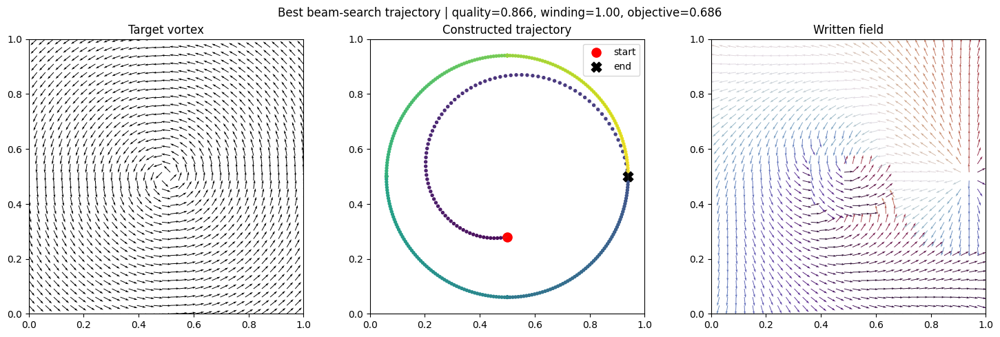

In [37]:
def plot_target_trajectory_written(x, y, X, Y, Px, Py, title=""):
    Tx, Ty = target_vortex(X, Y)

    fig, ax = plt.subplots(1, 3, figsize=(15, 4.8))

    s = slice(None, None, 3)

    # Target vortex
    ax[0].quiver(
        X[s, s],
        Y[s, s],
        Tx[s, s],
        Ty[s, s],
        scale=30
    )
    ax[0].set_title("Target vortex")

    # Colored trajectory
    progress = np.linspace(0, 1, len(x))

    ax[1].scatter(
        x,
        y,
        c=progress,
        cmap="viridis",
        s=8
    )
    ax[1].plot(x, y, color="gray", alpha=0.25, lw=0.7)
    ax[1].scatter(x[0], y[0], color="red", marker="o", s=90, label="start")
    ax[1].scatter(x[-1], y[-1], color="black", marker="X", s=110, label="end")
    ax[1].legend()
    ax[1].set_title("Constructed trajectory")

    # Written field
    angle = np.arctan2(Py, Px)

    ax[2].quiver(
        X[s, s],
        Y[s, s],
        Px[s, s],
        Py[s, s],
        angle[s, s],
        cmap="twilight",
        scale=30
    )
    ax[2].set_title("Written field")

    for a in ax:
        a.set_aspect("equal")
        a.set_xlim(0, 1)
        a.set_ylim(0, 1)

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()


# Re-evaluate best sequence at higher resolution
best_highres = evaluate_sequence(
    best["sequence"],
    primitive_library,
    N=100,
    cache=None
)

plot_target_trajectory_written(
    best_highres["x"],
    best_highres["y"],
    best_highres["X"],
    best_highres["Y"],
    best_highres["Px"],
    best_highres["Py"],
    title=(
        f"Best beam-search trajectory | "
        f"quality={best_highres['quality']:.3f}, "
        f"winding={best_highres['winding_number']:.2f}, "
        f"objective={best_highres['objective']:.3f}"
    )
)

,step,best_objective,best_quality,best_coverage,best_alignment,best_winding,best_path_length
0,1,0.759973,0.827102,0.979167,0.689400,-1.413580e-16,1.570980
1,2,0.754166,0.862030,0.994681,0.733279,0.000000e+00,2.262115
2,3,0.719340,0.867937,0.994681,0.745158,0.000000e+00,2.953251
3,4,0.725848,0.865179,0.994681,0.739612,1.000000e+00,3.644386
4,5,0.683944,0.864009,0.994681,0.737260,1.000000e+00,4.335522


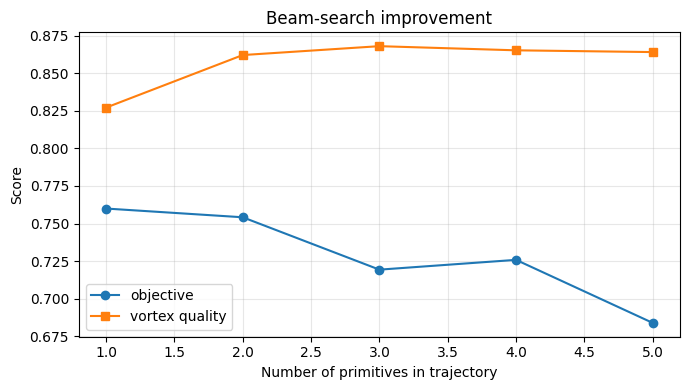

In [38]:
progress_rows = []

for step_df in beam_history:
    best_row = step_df.sort_values("objective", ascending=False).iloc[0]

    progress_rows.append({
        "step": int(best_row["step"]),
        "best_objective": best_row["objective"],
        "best_quality": best_row["quality"],
        "best_coverage": best_row["coverage"],
        "best_alignment": best_row["alignment"],
        "best_winding": best_row["winding_number"],
        "best_path_length": best_row["path_length"]
    })

df_progress = pd.DataFrame(progress_rows)

display(df_progress)

plt.figure(figsize=(7, 4))

plt.plot(
    df_progress["step"],
    df_progress["best_objective"],
    marker="o",
    label="objective"
)

plt.plot(
    df_progress["step"],
    df_progress["best_quality"],
    marker="s",
    label="vortex quality"
)

plt.xlabel("Number of primitives in trajectory")
plt.ylabel("Score")
plt.title("Beam-search improvement")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

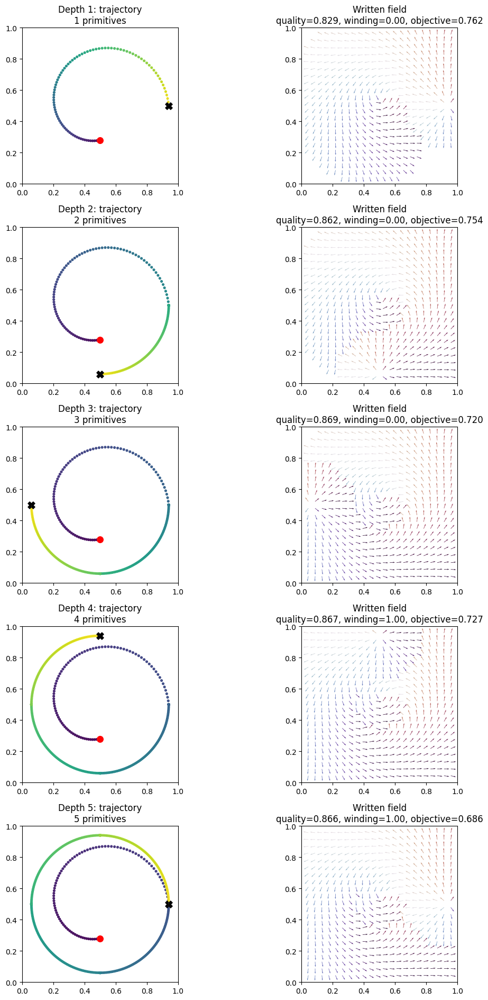

In [39]:
def plot_best_each_depth(beam_history, primitive_library):
    n = len(beam_history)

    fig, axes = plt.subplots(n, 2, figsize=(12, 3.8*n), squeeze=False)

    for i, step_df in enumerate(beam_history):
        best_row = step_df.sort_values("objective", ascending=False).iloc[0]
        seq = best_row["sequence"]

        result = evaluate_sequence(
            seq,
            primitive_library,
            N=70,
            cache=None
        )

        x = result["x"]
        y = result["y"]
        X = result["X"]
        Y = result["Y"]
        Px = result["Px"]
        Py = result["Py"]

        # Trajectory
        ax = axes[i, 0]

        progress = np.linspace(0, 1, len(x))

        ax.scatter(x, y, c=progress, cmap="viridis", s=7)
        ax.plot(x, y, color="gray", alpha=0.25, lw=0.6)
        ax.scatter(x[0], y[0], color="red", marker="o", s=70)
        ax.scatter(x[-1], y[-1], color="black", marker="X", s=90)

        ax.set_aspect("equal")
        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)

        ax.set_title(
            f"Depth {i+1}: trajectory\n"
            f"{len(seq)} primitives"
        )

        # Written field
        ax = axes[i, 1]

        s = slice(None, None, 3)
        angle = np.arctan2(Py, Px)

        ax.quiver(
            X[s, s],
            Y[s, s],
            Px[s, s],
            Py[s, s],
            angle[s, s],
            cmap="twilight",
            scale=30
        )

        ax.set_aspect("equal")
        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)

        ax.set_title(
            f"Written field\n"
            f"quality={result['quality']:.3f}, "
            f"winding={result['winding_number']:.2f}, "
            f"objective={result['objective']:.3f}"
        )

    plt.tight_layout()
    plt.show()


plot_best_each_depth(beam_history, primitive_library)

# How the trajectory is scored

After a candidate trajectory is generated, the forward simulator calculates the written vector field:

$$
(P_x, P_y)
$$

This written field is compared against a target vortex field:

$$
(T_x, T_y)
$$

The scoring has three main parts:

1. **quality**
2. **winding number**
3. **objective**

---

# 1. Vortex quality

The quality score measures how well the written field locally matches the target vortex.

The target vortex is defined as:

$$
T_x = -(Y-y_c)
$$

$$
T_y = X-x_c
$$

The target field is then normalized so that every vector has unit length:

$$
\sqrt{T_x^2 + T_y^2} = 1
$$

The written field is also treated as a unit vector field.

We evaluate the score only in an annular region around the center:

$$
0.08 < R < 0.46
$$

where

$$
R = \sqrt{(X-x_c)^2 + (Y-y_c)^2}
$$

This avoids the exact vortex center, where the direction is undefined, and avoids edge effects near the image boundary.

---

## Coverage

Coverage measures how much of the target region was actually written:

$$
\text{coverage}
=
\frac{
\text{number of written pixels inside ROI}
}{
\text{total number of pixels inside ROI}
}
$$

A coverage value of 1 means the entire scoring region was written.

A coverage value of 0 means nothing was written in the scoring region.

---

## Alignment

Alignment measures whether the written vectors point in the same direction as the target vortex vectors.

For every written pixel, we compute the dot product:

$$
\text{dot}
=
P_xT_x + P_yT_y
$$

Because both vectors are normalized:

| Dot product | Meaning |
|---:|---|
| 1 | perfect direction match |
| 0 | perpendicular direction |
| -1 | opposite direction |

The alignment is the average dot product over all valid written pixels:

$$
\text{alignment}
=
\left\langle P_xT_x + P_yT_y \right\rangle
$$

---

## Direction score

The alignment ranges from -1 to +1, so we convert it to a 0-to-1 direction score:

$$
\text{direction score}
=
\frac{\text{alignment}+1}{2}
$$

So:

$$
\text{alignment}=1
\Rightarrow
\text{direction score}=1
$$

$$
\text{alignment}=0
\Rightarrow
\text{direction score}=0.5
$$

$$
\text{alignment}=-1
\Rightarrow
\text{direction score}=0
$$

---

## Final quality score

The final vortex quality is:

$$
\boxed{
\text{quality}
=
\text{coverage}
\times
\frac{\text{alignment}+1}{2}
}
$$

This means a trajectory gets a high quality score only if it writes a large part of the target region and the written vectors point in the correct vortex direction.

---

# 2. Winding number

The quality score checks local vector alignment, but it does not fully check whether the pattern has vortex topology.

To estimate whether the written field is truly vortex-like, we calculate a winding number.

The vector angle is:

$$
\theta = \tan^{-1}\left(\frac{P_y}{P_x}\right)
$$

We sample the written vector field along a circular loop around the center. Then we unwrap the vector angle and calculate the total angle rotation around the loop:

$$
\Delta \theta = \theta_{\text{final}} - \theta_{\text{initial}}
$$

The winding number is:

$$
\boxed{
w =
\frac{\Delta \theta}{2\pi}
}
$$

Interpretation:

| Winding number | Meaning |
|---:|---|
| \(w \approx +1\) | counter-clockwise vortex-like field |
| \(w \approx -1\) | clockwise vortex-like field |
| \(w \approx 0\) | not vortex-like |
| non-integer value | partial or noisy vortex-like structure |

The winding number is useful because a field may have decent local alignment but still fail to form a globally rotating vortex.

---

## Winding score

For the objective, we convert the winding number into a score that rewards values close to +1 or -1:

$$
\text{winding score}
=
1 - \left| |w| - 1 \right|
$$

The score is clipped so that it cannot go below 0:

$$
\boxed{
\text{winding score}
=
\max\left(0,\; 1 - \left| |w| - 1 \right|\right)
}
$$

Examples:

| Winding number | Winding score |
|---:|---:|
| +1 | 1 |
| -1 | 1 |
| 0 | 0 |
| 0.5 | 0.5 |
| 1.3 | 0.7 |

This score rewards vortex-like topology regardless of clockwise or counter-clockwise direction.

---

# 3. Objective function

The objective is the final score used by beam search to decide which partial trajectory to keep.

The objective combines:

1. vortex quality,
2. winding score,
3. path length penalty,
4. number-of-primitives penalty.

The objective used in the code is:

$$
\boxed{
\text{objective}
=
\text{quality}
+
0.05 \times \text{winding score}
-
0.03 \times \text{path length}
-
0.02 \times \text{number of primitives}
}
$$

The terms mean:

| Term | Purpose |
|---|---|
| quality | rewards local match to target vortex |
| \(0.05 \times \text{winding score}\) | rewards global vortex-like topology |
| \(-0.03 \times \text{path length}\) | penalizes long writing trajectories |
| \(-0.02 \times \text{number of primitives}\) | penalizes unnecessarily complicated trajectories |

---

# Why use objective instead of quality alone?

Quality alone may favor long trajectories that write a large area.

However, in a real AFM experiment, long trajectories are not always desirable because they can:

- take more time,
- increase tip wear,
- increase sample damage,
- cause more drift,
- overwrite previously written regions.

Therefore, the objective rewards vortex quality but also prefers shorter and simpler trajectories.

---

# Summary

The scoring hierarchy is:

$$
\text{written field}
\rightarrow
\text{quality}
\rightarrow
\text{winding number}
\rightarrow
\text{objective}
$$

where:

$$
\text{quality}
=
\text{coverage}
\times
\frac{\text{alignment}+1}{2}
$$

$$
w =
\frac{\Delta \theta}{2\pi}
$$

$$
\text{objective}
=
\text{quality}
+
0.05 \times \text{winding score}
-
0.03 \times \text{path length}
-
0.02 \times \text{number of primitives}
$$

In simple words:

**quality** checks local agreement with the target vortex.

**winding** checks global vortex-like topology.

**objective** checks whether the trajectory writes a good vortex efficiently.

In [40]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, WhiteKernel, ConstantKernel
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

# ------------------------------------------------------------
# Primitive type list
# ------------------------------------------------------------
primitive_types = sorted(list(set(p["type"] for p in primitive_library)))
primitive_type_to_idx = {t: i for i, t in enumerate(primitive_types)}

print("Primitive types:", primitive_types)


def sequence_features(sequence, primitive_library):
    """
    Convert a primitive sequence into fixed-length numerical features.

    These features are cheap to compute because they use only trajectory geometry,
    not the written field.
    """
    if len(sequence) == 0:
        return np.zeros(20 + len(primitive_types), dtype=float)

    x, y, V = sequence_to_path(sequence, primitive_library)

    # Path geometry
    L = trajectory_length(x, y)

    r = np.hypot(x - 0.5, y - 0.5)
    theta = np.unwrap(np.arctan2(y - 0.5, x - 0.5))

    total_angle_change = theta[-1] - theta[0]
    abs_angle_change = np.sum(np.abs(np.diff(theta)))

    start_r = r[0]
    end_r = r[-1]

    start_theta = np.arctan2(y[0] - 0.5, x[0] - 0.5)
    end_theta = np.arctan2(y[-1] - 0.5, x[-1] - 0.5)

    net_displacement = np.hypot(x[-1] - x[0], y[-1] - y[0])

    write_fraction = np.mean(V != 0)

    # Primitive type counts
    type_counts = np.zeros(len(primitive_types), dtype=float)

    for pid in sequence:
        ptype = primitive_library[pid]["type"]
        type_counts[primitive_type_to_idx[ptype]] += 1

    type_counts = type_counts / max(1, len(sequence))

    base_features = np.array([
        len(sequence),
        L,
        net_displacement,
        np.mean(r),
        np.std(r),
        np.min(r),
        np.max(r),
        start_r,
        end_r,
        start_theta,
        end_theta,
        total_angle_change,
        abs_angle_change,
        write_fraction,
        np.mean(x),
        np.mean(y),
        np.std(x),
        np.std(y),
        np.min(x),
        np.max(x),
    ], dtype=float)

    return np.concatenate([base_features, type_counts])


def make_X_from_sequences(sequences, primitive_library):
    return np.vstack([
        sequence_features(seq, primitive_library)
        for seq in sequences
    ])

Primitive types: ['half_arc', 'quarter_arc', 'spiral_fragment', 'tangent_line']


In [41]:
rng = np.random.default_rng(0)

def random_sequence(
    primitive_library,
    min_len=2,
    max_len=5,
    allow_repeats=False
):
    length = rng.integers(min_len, max_len + 1)

    if allow_repeats:
        seq = rng.integers(0, len(primitive_library), size=length)
        return tuple(int(i) for i in seq)

    length = min(length, len(primitive_library))
    seq = rng.choice(len(primitive_library), size=length, replace=False)

    return tuple(int(i) for i in seq)


def mutate_sequence(
    seq,
    primitive_library,
    max_len=6,
    p_replace=0.5,
    p_insert=0.25,
    p_delete=0.15,
    p_swap=0.10,
    allow_repeats=False
):
    """
    Randomly modify a primitive sequence.
    """
    seq = list(seq)

    u = rng.random()

    # Replace one primitive
    if u < p_replace and len(seq) > 0:
        idx = rng.integers(0, len(seq))

        if allow_repeats:
            new_pid = int(rng.integers(0, len(primitive_library)))
        else:
            available = list(set(range(len(primitive_library))) - set(seq))
            if len(available) > 0:
                new_pid = int(rng.choice(available))
            else:
                new_pid = seq[idx]

        seq[idx] = new_pid

    # Insert a new primitive
    elif u < p_replace + p_insert and len(seq) < max_len:
        insert_idx = rng.integers(0, len(seq) + 1)

        if allow_repeats:
            new_pid = int(rng.integers(0, len(primitive_library)))
        else:
            available = list(set(range(len(primitive_library))) - set(seq))
            if len(available) > 0:
                new_pid = int(rng.choice(available))
            else:
                return tuple(seq)

        seq.insert(insert_idx, new_pid)

    # Delete one primitive
    elif u < p_replace + p_insert + p_delete and len(seq) > 1:
        del_idx = rng.integers(0, len(seq))
        seq.pop(del_idx)

    # Swap order of two primitives
    elif len(seq) > 1:
        i, j = rng.choice(len(seq), size=2, replace=False)
        seq[i], seq[j] = seq[j], seq[i]

    return tuple(seq)


def crossover_sequences(seq1, seq2, max_len=6, allow_repeats=False):
    """
    One-point crossover between two parent sequences.
    """
    if len(seq1) == 0 or len(seq2) == 0:
        return seq1

    cut1 = rng.integers(1, len(seq1) + 1)
    cut2 = rng.integers(0, len(seq2))

    child = list(seq1[:cut1]) + list(seq2[cut2:])
    child = child[:max_len]

    if not allow_repeats:
        cleaned = []
        seen = set()

        for pid in child:
            if pid not in seen:
                cleaned.append(pid)
                seen.add(pid)

        child = cleaned

    if len(child) == 0:
        child = list(random_sequence(
            primitive_library,
            min_len=1,
            max_len=1,
            allow_repeats=allow_repeats
        ))

    return tuple(child)


def generate_offspring(
    elite_sequences,
    primitive_library,
    n_offspring=200,
    max_len=6,
    mutation_rate=0.7,
    allow_repeats=False
):
    """
    Generate many candidate sequences using mutation and crossover.
    """
    offspring = set()

    while len(offspring) < n_offspring:
        if len(elite_sequences) >= 2 and rng.random() > mutation_rate:
            p1, p2 = rng.choice(len(elite_sequences), size=2, replace=False)
            child = crossover_sequences(
                elite_sequences[p1],
                elite_sequences[p2],
                max_len=max_len,
                allow_repeats=allow_repeats
            )
        else:
            parent = elite_sequences[int(rng.integers(0, len(elite_sequences)))]
            child = mutate_sequence(
                parent,
                primitive_library,
                max_len=max_len,
                allow_repeats=allow_repeats
            )

        offspring.add(child)

    return list(offspring)

In [42]:
def exact_evaluate_sequence(sequence, primitive_library, N_exact=70):
    """
    This is the expensive step.

    In this notebook:
        exact evaluation = simulate written field + calculate objective.

    In real experiment:
        exact evaluation = write trajectory on AFM + measure field + score it.
    """
    result = evaluate_sequence(
        sequence,
        primitive_library,
        N=N_exact,
        cache=None
    )

    row = {
        "sequence": tuple(sequence),
        "objective": result["objective"],
        "quality": result["quality"],
        "coverage": result["coverage"],
        "alignment": result["alignment"],
        "winding_number": result["winding_number"],
        "winding_score": result["winding_score"],
        "path_length": result["path_length"],
        "n_primitives": result["n_primitives"],
        "primitive_names": " | ".join(
            primitive_library[pid]["name"] for pid in sequence
        )
    }

    saved = {
        "x": result["x"],
        "y": result["y"],
        "V": result["V"],
        "X": result["X"],
        "Y": result["Y"],
        "Px": result["Px"],
        "Py": result["Py"]
    }

    return row, saved


def train_gp_surrogate(archive_df, primitive_library):
    """
    Train GP surrogate:
        sequence geometry features -> objective
    """
    sequences = list(archive_df["sequence"])
    X_train = make_X_from_sequences(sequences, primitive_library)
    y_train = archive_df["objective"].values.astype(float)

    kernel = (
        ConstantKernel(1.0, (1e-3, 1e3))
        * Matern(length_scale=np.ones(X_train.shape[1]), nu=2.5)
        + WhiteKernel(noise_level=1e-5)
    )

    model = make_pipeline(
        StandardScaler(),
        GaussianProcessRegressor(
            kernel=kernel,
            normalize_y=True,
            n_restarts_optimizer=2,
            random_state=0
        )
    )

    model.fit(X_train, y_train)

    return model

In [43]:
def surrogate_assisted_ga(
    primitive_library,
    n_initial=15,
    n_generations=8,
    n_offspring=250,
    n_exact_per_generation=5,
    elite_size=8,
    max_len=6,
    beta=1.0,
    allow_repeats=False,
    N_exact=70
):
    """
    Surrogate-assisted genetic algorithm.

    Exact evaluations are expensive, so we only evaluate:
        - initial random sequences
        - a small number of surrogate-selected candidates per generation

    The GP surrogate predicts objective and uncertainty for many offspring.
    We select candidates using:
        acquisition = predicted objective + beta * uncertainty
    """
    archive_rows = []
    saved_results = {}
    evaluated = set()

    # ------------------------------------------------------------
    # Initial exact evaluations
    # ------------------------------------------------------------
    print("Running initial exact evaluations...")

    while len(archive_rows) < n_initial:
        seq = random_sequence(
            primitive_library,
            min_len=2,
            max_len=max_len,
            allow_repeats=allow_repeats
        )

        if seq in evaluated:
            continue

        row, saved = exact_evaluate_sequence(
            seq,
            primitive_library,
            N_exact=N_exact
        )

        archive_rows.append(row)
        saved_results[seq] = saved
        evaluated.add(seq)

    archive_df = pd.DataFrame(archive_rows)

    best_history = []

    # ------------------------------------------------------------
    # Generations
    # ------------------------------------------------------------
    for gen in range(1, n_generations + 1):

        archive_df = archive_df.sort_values(
            "objective",
            ascending=False
        ).reset_index(drop=True)

        best = archive_df.iloc[0]

        best_history.append({
            "generation": gen - 1,
            "n_exact_evals": len(archive_df),
            "best_objective": best["objective"],
            "best_quality": best["quality"],
            "best_winding": best["winding_number"],
            "best_sequence": best["sequence"]
        })

        print(
            f"\nGeneration {gen} | "
            f"exact evals so far={len(archive_df)} | "
            f"best objective={best['objective']:.3f} | "
            f"quality={best['quality']:.3f} | "
            f"winding={best['winding_number']:.2f}"
        )

        # Train surrogate
        model = train_gp_surrogate(archive_df, primitive_library)

        # Choose elites from exactly evaluated archive
        elite_sequences = list(archive_df.head(elite_size)["sequence"])

        # Generate GA offspring
        offspring = generate_offspring(
            elite_sequences,
            primitive_library,
            n_offspring=n_offspring,
            max_len=max_len,
            allow_repeats=allow_repeats
        )

        # Remove already evaluated candidates
        offspring = [seq for seq in offspring if seq not in evaluated]

        if len(offspring) == 0:
            print("No new offspring found.")
            break

        # Surrogate prediction for all offspring
        X_pool = make_X_from_sequences(offspring, primitive_library)

        mu, sigma = model.predict(X_pool, return_std=True)

        acquisition = mu + beta * sigma

        ranked_idx = np.argsort(acquisition)[::-1]

        chosen = []

        for idx in ranked_idx:
            seq = offspring[idx]
            chosen.append(seq)

            if len(chosen) >= n_exact_per_generation:
                break

        # Exact evaluation of selected candidates
        new_rows = []

        for seq in chosen:
            row, saved = exact_evaluate_sequence(
                seq,
                primitive_library,
                N_exact=N_exact
            )

            new_rows.append(row)
            saved_results[seq] = saved
            evaluated.add(seq)

            print(
                f"  evaluated candidate | "
                f"objective={row['objective']:.3f}, "
                f"quality={row['quality']:.3f}, "
                f"winding={row['winding_number']:.2f}, "
                f"len={row['n_primitives']} | "
                f"{seq}"
            )

        archive_df = pd.concat(
            [archive_df, pd.DataFrame(new_rows)],
            ignore_index=True
        )

    # final record
    archive_df = archive_df.sort_values(
        "objective",
        ascending=False
    ).reset_index(drop=True)

    best = archive_df.iloc[0]

    best_history.append({
        "generation": n_generations,
        "n_exact_evals": len(archive_df),
        "best_objective": best["objective"],
        "best_quality": best["quality"],
        "best_winding": best["winding_number"],
        "best_sequence": best["sequence"]
    })

    history_df = pd.DataFrame(best_history)

    return archive_df, saved_results, history_df


archive_df, ga_saved_results, ga_history = surrogate_assisted_ga(
    primitive_library,
    n_initial=15,
    n_generations=8,
    n_offspring=250,
    n_exact_per_generation=5,
    elite_size=8,
    max_len=6,
    beta=1.2,
    allow_repeats=False,
    N_exact=70
)

print("\nTop trajectories found:")
display(archive_df.head(10))

Running initial exact evaluations...

Generation 1 | exact evals so far=15 | best objective=0.603 | quality=0.629 | winding=1.00


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 1 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 3 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 4 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:

  evaluated candidate | objective=0.296, quality=0.354, winding=nan, len=2 | (5, 52)
  evaluated candidate | objective=0.245, quality=0.388, winding=1.00, len=4 | (39, 60, 48, 15)
  evaluated candidate | objective=0.563, quality=0.666, winding=1.00, len=4 | (50, 0, 24, 52)
  evaluated candidate | objective=0.221, quality=0.362, winding=1.00, len=4 | (39, 23, 48, 15)
  evaluated candidate | objective=0.579, quality=0.660, winding=1.00, len=3 | (24, 5, 34)

Generation 2 | exact evals so far=20 | best objective=0.603 | quality=0.629 | winding=1.00


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 7 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 11 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py

  evaluated candidate | objective=0.468, quality=0.586, winding=1.00, len=4 | (19, 0, 24, 52)
  evaluated candidate | objective=0.529, quality=0.597, winding=1.00, len=3 | (50, 24, 52)
  evaluated candidate | objective=0.665, quality=0.736, winding=1.00, len=3 | (24, 60, 34)
  evaluated candidate | objective=0.536, quality=0.655, winding=1.00, len=4 | (33, 49, 24, 52)
  evaluated candidate | objective=0.439, quality=0.536, winding=1.00, len=4 | (50, 51, 24, 52)

Generation 3 | exact evals so far=25 | best objective=0.665 | quality=0.736 | winding=1.00


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 1 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 5 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 7 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:

  evaluated candidate | objective=0.425, quality=0.502, winding=1.00, len=3 | (21, 24, 52)
  evaluated candidate | objective=0.557, quality=0.654, winding=0.00, len=2 | (24, 34)
  evaluated candidate | objective=0.560, quality=0.665, winding=1.00, len=4 | (5, 34, 0, 42)
  evaluated candidate | objective=0.547, quality=0.663, winding=1.00, len=4 | (50, 0, 34, 42)
  evaluated candidate | objective=0.451, quality=0.574, winding=1.00, len=3 | (24, 39, 34)

Generation 4 | exact evals so far=30 | best objective=0.665 | quality=0.736 | winding=1.00


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 5 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 12 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py

  evaluated candidate | objective=0.523, quality=0.666, winding=1.00, len=5 | (7, 50, 0, 24, 52)
  evaluated candidate | objective=0.528, quality=0.666, winding=1.00, len=5 | (14, 50, 0, 24, 52)
  evaluated candidate | objective=0.547, quality=0.573, winding=1.00, len=2 | (4, 34)
  evaluated candidate | objective=0.560, quality=0.629, winding=1.00, len=3 | (33, 5, 34)
  evaluated candidate | objective=0.576, quality=0.567, winding=1.00, len=1 | (34,)

Generation 5 | exact evals so far=35 | best objective=0.665 | quality=0.736 | winding=1.00


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 4 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 5 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 13 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py

  evaluated candidate | objective=0.316, quality=0.330, winding=1.00, len=2 | (5, 49)
  evaluated candidate | objective=0.674, quality=0.694, winding=1.00, len=2 | (34, 54)
  evaluated candidate | objective=0.483, quality=0.564, winding=1.00, len=3 | (24, 0, 42)
  evaluated candidate | objective=0.536, quality=0.562, winding=1.00, len=2 | (0, 42)
  evaluated candidate | objective=0.597, quality=0.678, winding=1.00, len=3 | (24, 5, 40)

Generation 6 | exact evals so far=40 | best objective=0.674 | quality=0.694 | winding=1.00


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 2 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 7 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 9 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:

  evaluated candidate | objective=0.618, quality=0.694, winding=1.00, len=3 | (25, 34, 54)
  evaluated candidate | objective=0.607, quality=0.701, winding=1.00, len=3 | (47, 34, 54)
  evaluated candidate | objective=0.658, quality=0.682, winding=1.00, len=2 | (60, 34)
  evaluated candidate | objective=0.628, quality=0.656, winding=1.00, len=2 | (61, 34)
  evaluated candidate | objective=0.544, quality=0.641, winding=0.00, len=2 | (29, 34)

Generation 7 | exact evals so far=45 | best objective=0.674 | quality=0.694 | winding=1.00


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 6 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 11 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 13 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.p

  evaluated candidate | objective=0.642, quality=0.704, winding=1.00, len=3 | (60, 14, 34)
  evaluated candidate | objective=0.658, quality=0.719, winding=1.00, len=3 | (32, 34, 54)
  evaluated candidate | objective=0.329, quality=0.367, winding=1.00, len=2 | (34, 41)
  evaluated candidate | objective=0.641, quality=0.700, winding=1.00, len=3 | (52, 60, 34)
  evaluated candidate | objective=0.651, quality=0.718, winding=1.00, len=3 | (14, 60, 34)

Generation 8 | exact evals so far=50 | best objective=0.674 | quality=0.694 | winding=1.00


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 2 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 4 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 7 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:

  evaluated candidate | objective=0.614, quality=0.719, winding=1.00, len=4 | (32, 58, 34, 54)
  evaluated candidate | objective=0.592, quality=0.621, winding=1.00, len=2 | (34, 52)
  evaluated candidate | objective=0.559, quality=0.621, winding=1.00, len=3 | (60, 34, 52)
  evaluated candidate | objective=0.622, quality=0.697, winding=1.00, len=3 | (32, 61, 34)
  evaluated candidate | objective=0.648, quality=0.724, winding=1.00, len=3 | (32, 60, 34)

Top trajectories found:


,sequence,objective,quality,coverage,alignment,winding_number,winding_score,path_length,n_primitives,primitive_names
0,"(34, 54)",0.673519,0.693731,0.965909,0.436431,1.0,1.0,1.007067,2,CW half arc r=0.22 th=180 | CW tangent line r=...
1,"(24, 60, 34)",0.664583,0.735899,1.000000,0.471797,1.0,1.0,2.043864,3,CW quarter arc r=0.44 th=0 | CW tangent line r...
2,"(60, 34)",0.657744,0.681948,0.944805,0.443575,1.0,1.0,1.140136,2,CW tangent line r=0.38 th=225 | CW half arc r=...
3,"(32, 34, 54)",0.657728,0.718674,1.000000,0.437348,1.0,1.0,1.698188,3,CW half arc r=0.22 th=0 | CW half arc r=0.22 t...
4,"(14, 60, 34)",0.651264,0.718319,0.988636,0.453152,1.0,1.0,1.901836,3,CW quarter arc r=0.26 th=270 | CW tangent line...
5,"(32, 60, 34)",0.648360,0.723729,1.000000,0.447457,1.0,1.0,2.178958,3,CW half arc r=0.22 th=0 | CW tangent line r=0....
6,"(60, 14, 34)",0.642321,0.703705,0.988636,0.423588,1.0,1.0,1.712821,3,CW tangent line r=0.38 th=225 | CW quarter arc...
7,"(52, 60, 34)",0.641099,0.699726,0.965909,0.448845,1.0,1.0,1.620904,3,CW tangent line r=0.24 th=225 | CW tangent lin...
8,"(61, 34)",0.627770,0.655534,0.944805,0.387660,1.0,1.0,1.258822,2,CCW tangent line r=0.38 th=225 | CW half arc r...
9,"(32, 61, 34)",0.621946,0.697315,1.000000,0.394629,1.0,1.0,2.178958,3,CW half arc r=0.22 th=0 | CCW tangent line r=0...


,generation,n_exact_evals,best_objective,best_quality,best_winding,best_sequence
0,0,15,0.602604,0.629038,1.0,"(5, 34)"
1,1,20,0.602604,0.629038,1.0,"(5, 34)"
2,2,25,0.664583,0.735899,1.0,"(24, 60, 34)"
3,3,30,0.664583,0.735899,1.0,"(24, 60, 34)"
4,4,35,0.664583,0.735899,1.0,"(24, 60, 34)"
5,5,40,0.673519,0.693731,1.0,"(34, 54)"
6,6,45,0.673519,0.693731,1.0,"(34, 54)"
7,7,50,0.673519,0.693731,1.0,"(34, 54)"
8,8,55,0.673519,0.693731,1.0,"(34, 54)"


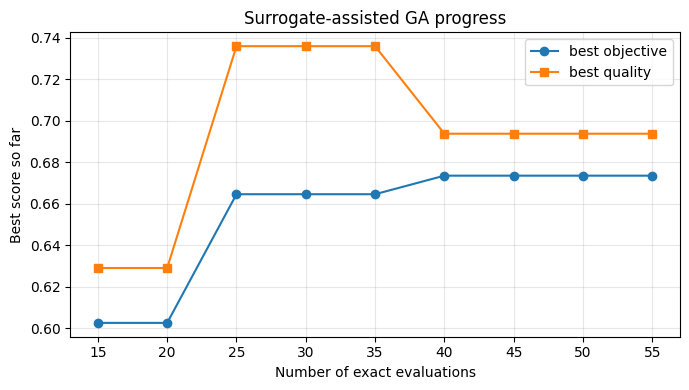

In [44]:
display(ga_history)

plt.figure(figsize=(7, 4))

plt.plot(
    ga_history["n_exact_evals"],
    ga_history["best_objective"],
    marker="o",
    label="best objective"
)

plt.plot(
    ga_history["n_exact_evals"],
    ga_history["best_quality"],
    marker="s",
    label="best quality"
)

plt.xlabel("Number of exact evaluations")
plt.ylabel("Best score so far")
plt.title("Surrogate-assisted GA progress")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

Best GA sequence:
(34, 54)

Primitive names:
34: CW half arc r=0.22 th=180
54: CW tangent line r=0.24 th=315

Best scores:


,sequence,objective,quality,coverage,alignment,winding_number,winding_score,path_length,n_primitives,primitive_names
0,"(34, 54)",0.673519,0.693731,0.965909,0.436431,1.0,1.0,1.007067,2,CW half arc r=0.22 th=180 | CW tangent line r=...


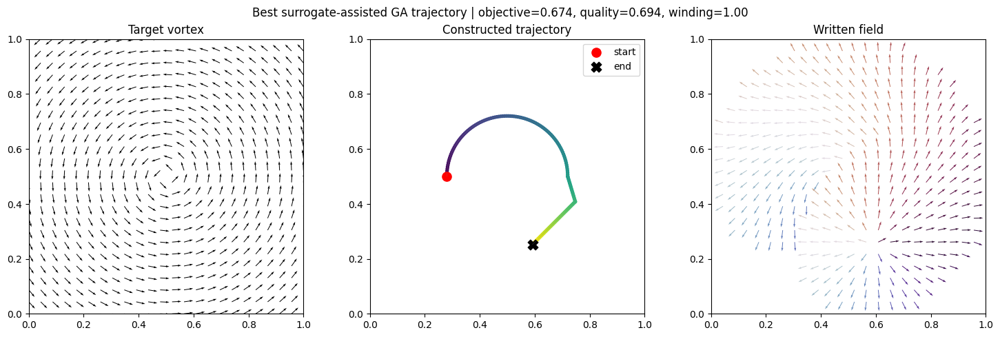

In [45]:
def plot_target_trajectory_written(x, y, X, Y, Px, Py, title=""):
    Tx, Ty = target_vortex(X, Y)

    fig, ax = plt.subplots(1, 3, figsize=(15, 4.8))

    s = slice(None, None, 3)

    # Target vortex
    ax[0].quiver(
        X[s, s],
        Y[s, s],
        Tx[s, s],
        Ty[s, s],
        scale=30
    )
    ax[0].set_title("Target vortex")

    # Colored trajectory
    progress = np.linspace(0, 1, len(x))

    ax[1].scatter(
        x,
        y,
        c=progress,
        cmap="viridis",
        s=8
    )

    ax[1].plot(x, y, color="gray", alpha=0.25, lw=0.7)
    ax[1].scatter(x[0], y[0], color="red", marker="o", s=90, label="start")
    ax[1].scatter(x[-1], y[-1], color="black", marker="X", s=110, label="end")
    ax[1].legend()
    ax[1].set_title("Constructed trajectory")

    # Written field
    angle = np.arctan2(Py, Px)

    ax[2].quiver(
        X[s, s],
        Y[s, s],
        Px[s, s],
        Py[s, s],
        angle[s, s],
        cmap="twilight",
        scale=30
    )

    ax[2].set_title("Written field")

    for a in ax:
        a.set_aspect("equal")
        a.set_xlim(0, 1)
        a.set_ylim(0, 1)

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()


best_seq = archive_df.iloc[0]["sequence"]
best_saved = ga_saved_results[best_seq]

print("Best GA sequence:")
print(best_seq)

print("\nPrimitive names:")
for pid in best_seq:
    print(f"{pid}: {primitive_library[pid]['name']}")

print("\nBest scores:")
display(archive_df.head(1))

plot_target_trajectory_written(
    best_saved["x"],
    best_saved["y"],
    best_saved["X"],
    best_saved["Y"],
    best_saved["Px"],
    best_saved["Py"],
    title=(
        f"Best surrogate-assisted GA trajectory | "
        f"objective={archive_df.iloc[0]['objective']:.3f}, "
        f"quality={archive_df.iloc[0]['quality']:.3f}, "
        f"winding={archive_df.iloc[0]['winding_number']:.2f}"
    )
)

### How to export this notebook to GitHub

To export this Google Colab notebook to the specified GitHub page (`https://github.com/KalininGroup/camm_hackathon/tree/k4my4r/docs/day_15_`), follow these steps:

1.  **Save your changes**: Make sure all your work in this notebook is saved. You can do this by going to `File` > `Save` or by pressing `Ctrl + S` (or `Cmd + S` on Mac).

2.  **Open 'Save a copy to GitHub'**: Go to `File` > `Save a copy to GitHub...`.

3.  **Select Repository and Branch**:
    *   A dialog box will appear. You might need to authenticate with GitHub if you haven't already.
    *   In the 'Repository' dropdown, select or paste the repository URL: `KalininGroup/camm_hackathon`.
    *   In the 'Branch' dropdown, select or create the branch: `k4my4r/docs/day_15_`.
    *   You can choose a filename for your notebook (e.g., `vector_field_problem_solution.ipynb`).

4.  **Click 'OK'**: Once you've selected the correct repository and branch, click 'OK' to save the notebook. Colab will then push a copy of your notebook to the specified location on GitHub.